# GNNs and ADNI dataset

Using the codes by Sidney Hough, Julian Quevedo, and Pino Cholsaipant to the ADNI dataset (Alzheimer-Perusini) disease.

(https://i.imgur.com/FYaEgKW.jpg)

All the imports and installs we'll need.


In [31]:
import os
#import torch
#from torch import nn
import numpy as np
import matplotlib.pyplot as plt
#from tqdm import tqdm

from nilearn import datasets
from nilearn import plotting
from nilearn.input_data import NiftiMapsMasker
from nilearn.connectome import ConnectivityMeasure

#import torch.nn.functional as F
#from torch.nn import Sequential, Linear, ReLU, GRU, BatchNorm1d
#from torch_geometric.nn import EdgeConv, GCNConv, GraphConv
#from torch_geometric.nn import global_mean_pool
#from torch_geometric.data import InMemoryDataset, Data, DataLoader
#from torch_geometric.utils import from_networkx

import networkx as nx
#from networkx.convert_matrix import from_numpy_matrix

In [32]:
from nilearn import datasets
from nilearn import plotting
from nilearn.input_data import NiftiMapsMasker
from nilearn.connectome import ConnectivityMeasure

In [33]:
import os
#import torch
#from torch import nn
import numpy as np
import matplotlib.pyplot as plt
#from tqdm import tqdm

from nilearn import datasets
from nilearn import plotting
from nilearn.input_data import NiftiMapsMasker
from nilearn.connectome import ConnectivityMeasure

#import torch.nn.functional as F
#from torch.nn import Sequential, Linear, ReLU, GRU, BatchNorm1d
#from torch_geometric.nn import EdgeConv, GCNConv, GraphConv
#from torch_geometric.nn import global_mean_pool
#from torch_geometric.data import InMemoryDataset, Data, DataLoader
#from torch_geometric.utils import from_networkx

import networkx as nx
#from networkx.convert_matrix import from_numpy_matrix

In [34]:
import networkx as nx
#from networkx.convert_matrix import from_numpy_matrix

In [35]:

from nilearn import datasets, input_data
import os
import numpy as np
import nibabel as nib
from nilearn import datasets, input_data, connectome
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np


atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps
atlas_labels = atlas.labels

# atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')


import os
import dicom2nifti
import dicom2nifti.settings as settings
import pydicom

# Define input and output directories
# dicom_folder = "/Users/mariamannone/Downloads/ADNI/012_S_4545/Resting_State_fMRI/2012-06-25_12_12_18.0/I312870"

# V04
#dicom_folder = "/Users/mariamannone/Downloads/ADNI 3/019_S_5019/Resting_State_fMRI/2012-11-07_13_45_02.0/I345555"

#dicom_folder = "/Users/mariamannone/Downloads/ADNI 3/019_S_5019/Resting_State_fMRI/2013-05-14_13_24_11.0/I372471"
# 019_S_5019, AD, F, 63-64,Resting State fMRI, v11, v04, v02, v05

#output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_1/"


# Other patient: 002_S_5018, ADNI, M, 73.4, 73.7, 73.9, 74.5, Resting State fMRI
dicom_folder = "/Users/mariamannone/Downloads/ADNI 4/002_S_5018/Resting_State_fMRI/2012-11-08_07_20_35.0/I346237"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_5/"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
settings.disable_validate_slice_increment()
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)

# Adapting something using my codes 

In [36]:
from nilearn import datasets, input_data
import os
import numpy as np
from nilearn.input_data import NiftiMapsMasker


# nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_1/output.nii.gz/"
nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_5/output.nii.gz/"


# Load the MSDL atlas
atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
time_series = []
labels = []

# Iterate over each NIfTI file in the folder
for file_name in os.listdir(nifti_folder):
    if file_name.endswith('.nii.gz'):
        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
        ts = masker.fit_transform(file_path)
        time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
        labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
for i, ts in enumerate(time_series):
    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')

/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/base_masker.py:253: UserWarning: memory_level is currently set to 0 but a Memory object has been provided. Setting memory_level to 1.
  return self.transform_single_imgs(


Calculating partial correlation matrix for each time series and taking the mean. This will serve as the basis for edges in the graphs we create later.



In [37]:
corr_measure = ConnectivityMeasure(kind='correlation')
pcorr_measure = ConnectivityMeasure(kind='partial correlation')

corr_matrices = corr_measure.fit_transform(time_series)
pcorr_matrices = pcorr_measure.fit_transform(time_series)


# STORING the information for learning & prediction

male_BL = corr_matrices

Let's visualize a functional connectome!

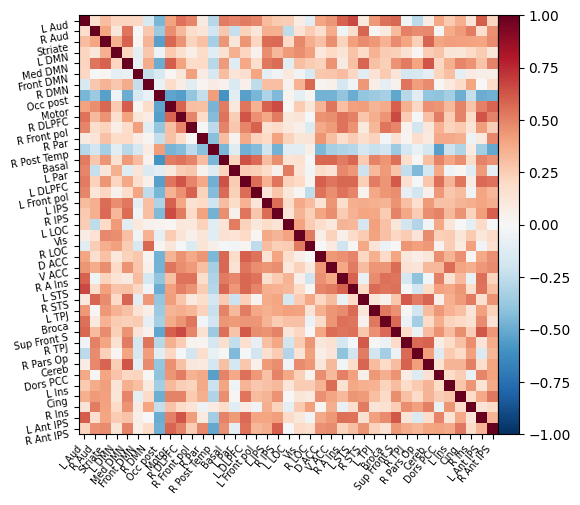

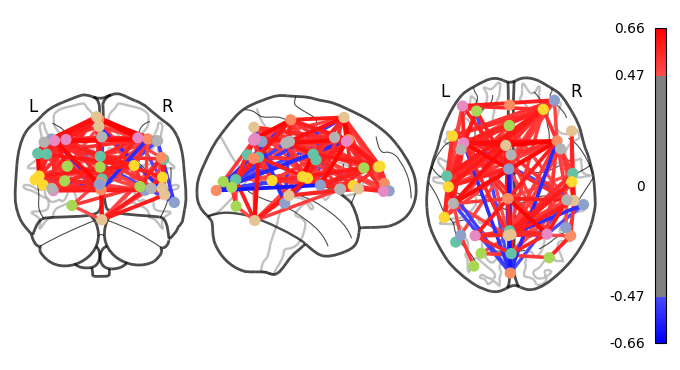

In [38]:
# Partial correlation matrix
plotting.plot_matrix(corr_matrices[0], labels=atlas_labels, colorbar=True, vmax=1, vmin=-1)

# Connectome over brain schematic
coords = atlas.region_coords # Get center coordinates of each ROI
plotting.plot_connectome(corr_matrices[0], coords, edge_threshold="80%", colorbar=True)

In [39]:
# April 19, clear command

del time_series
del corr_matrices
del pcorr_matrices
#del corr_matrices_fu1
#del pcorr_matrices_fu1
#del connectivity_matrix, correlation_matrix
#del connectivity_matrix_fu1, correlation_matrix_fu1, 
#del connectivity_matrix_fu1



#del(dicom_folder, output_folder, nifti_file, dicom_files, nifti_file, time_series, correlation_matrix, correlation_matrix_fu1, connectivity_matrix, connectivity_matrix_fu1)


In [40]:
# Following time point



import os
import numpy as np
import nibabel as nib
#from dcmstack import NiftiWrapper    commented 

# Define input and output directories
#dicom_folder = "/Users/mariamannone/Downloads/ADNI/012_S_4545/Resting_State_fMRI/2012-09-24_12_16_09.0/I336708"


# V11
#dicom_folder= "/Users/mariamannone/Downloads/ADNI 3/019_S_5019/Resting_State_fMRI/2013-02-11_14_39_50.0/I358811"
#output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_2/"

dicom_folder = "/Users/mariamannone/Downloads/ADNI 4/002_S_5018/Resting_State_fMRI/2013-02-11_07_46_12.0/I358614"
output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_6"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
settings.disable_validate_slice_increment()
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)

/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841643537523376046'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03817532478714656004'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03802804297410140032'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydico

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03875354874765925810'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03765266024018672441'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846328559108307523'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03805127677530489900'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842388100637063196'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03870310681855648802'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797084197215145000'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03876722626901693187'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03796961172356230845'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03890551085320208977'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03827359968132382437'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03815780150419376849'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03787178593661059183'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03829934888954013342'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03777043111864254248'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03766653437008975203'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03836933033135898951'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842429128145468242'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03873184298746880452'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842611501656460230'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03815019982788106194'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842215024579707323'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841439171865637505'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03869719710421811211'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03818765887305146246'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03875666992483051110'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03850442499665198936'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03814304141862186537'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797058380426497519'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793914592833687313'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830265925833028200'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03828122766232520653'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03853804892551023958'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03807007755557278596'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03785769997551046185'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838727850092788827'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03854728570475336272'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03801432604013941016'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03807218226034730640'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797280417637012978'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03806794270369499540'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03892862135377165386'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03823318333462987274'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838916666829804895'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03874083431933212830'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03762764248959275781'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03758747176418285763'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03829154423079936711'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03836523343697347316'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837539411011939778'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03785978461418677343'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03844493266353039327'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03827635695339782397'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03844278761028874514'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03825987608419477214'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03768481521012687890'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03801015204106038599'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03761957918040435507'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03804702914011689776'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03824098501643670980'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813516273404604136'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03856471797168332861'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03819220776136768524'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03812030582452845398'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03802941770677729109'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03869115537535572182'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03825010279004032747'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03791207297016845514'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03836844823029027041'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837879144130601335'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03853556111151690765'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03792878570612229524'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03814657980165260882'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03844259306870590932'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03873266903002094034'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03825479281977120891'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838415066117916293'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03854759208292510512'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03795552702006034176'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03785976885783017871'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841369670335548510'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03895054747673186930'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03869587438482733695'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03787940783420650284'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03827602211649129384'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03878395226787775251'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03839880526895652509'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838127712618922041'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03816074689048593626'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03820810224145281364'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03791311206625580730'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03865248199400242568'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03812687542064510337'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03868222425485108290'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03801136535903297799'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838488128553300249'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03815115400501644220'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793681043913568746'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03828075741853720946'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03794152649240019355'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03788872602769628573'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03854010257839314222'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03869597803188497431'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838396824196694817'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841425072048814023'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03802438468232473429'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793121447132531049'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03790664436895564022'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837118027807677027'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841269705042143146'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03799789264559682546'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03881564571808326228'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03789002082868479947'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03872759714364694640'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03822008432235979554'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03844237135351919736'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03795117186285110543'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03871111692639057288'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03879214171948779055'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03805233724511519137'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03822770507619868537'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03831177513425450584'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03784769063887337216'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03848640968549498900'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03890388119046675231'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03853641778243357076'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813720018467511654'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813137458824714635'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843998557391764347'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846315725931835407'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03853823776231554540'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843228166803206091'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03879798192606594403'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03781714858611269900'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03889859903457951878'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03812272443430588344'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03790888291321108223'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03840151127064404000'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03854511832804903921'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03853991494548191419'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03774994195588424638'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03890340899216134664'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843749527744642357'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03761760354083767297'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837136686303895648'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793834463951448012'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03829323229419592437'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03879823992417335896'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03815898299558290363'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03786308552134826487'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03890852237903021513'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03864298677883575890'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03800870420104221649'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03774823497510768447'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03774876676744643805'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03801172748908174143'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830093924655423788'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03774803601977350338'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03853649903502097877'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03851055335293289659'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846476232815353229'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841398416365126566'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03839259580930134210'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03801365644205579126'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03844410824034187051'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03788315556668633854'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03889386570373197153'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03773457575763536359'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793967133962668972'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03817971352370526120'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03839325187395418277'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838738414557224538'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03881589519731880113'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03829215960919209336'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03805336937302150641'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843755195354457427'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03856192769496948638'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03805945861791052789'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03864719587634054312'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841722317079103107'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03788846242819614922'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03819638286079911516'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03809192557771405142'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846065606210377667'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03855634406047989868'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03821240000581415868'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03762951016931083532'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03821917398414541690'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03889148109536134174'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813412672435721377'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03847321749081547561'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797055836463884147'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03855583260152526671'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793380780935266361'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03816244217474248726'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830585639308834569'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03876490267978199148'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03800550379854788967'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03839918988784350274'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03881775761086411384'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03871626413824169074'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03824845600914763051'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842269478395996633'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03849709975840290183'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03880171818655879374'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03864281723165635890'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03810960578944839169'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03862108093414721951'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03818474476853587603'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03820911928720521082'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03828452748612423944'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03807789116753349491'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03848747197706575982'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793809072391400773'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03784789171849293148'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03895900872313989010'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03799096379897931066'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03839686903009031204'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03794208310469333513'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03795425919298479709'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03895861871047513266'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03836787031036580140'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03854616113496717795'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03822492107562327711'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03856817096831463150'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03831510949275762146'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03776647512867159846'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843957560931456312'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03880081581514689259'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813756021216130239'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03889630705029788851'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03883231310557161528'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03815304414731046762'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03800360559621059023'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03851221550020694459'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03853562808111433436'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846313929637876595'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03792932904712246394'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837281727229773598'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830749687066660205'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03814931520889457944'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03894928599761111475'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03768742977646345673'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03809541400461918149'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797603771854965360'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03802850485975286205'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843077482227427117'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837287778896673619'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03863603408819616842'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03894465536488827624'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03779215972892067676'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842067127905160387'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03827869344576305102'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03791352697128025385'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03777447076014177960'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03853112897226264926'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838423312657367489'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03836511930015532337'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03796219436733148290'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03778265334998162866'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03794901968646888983'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03831725312851790869'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793089074328381768'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03801669043551250515'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03840654428814964977'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813423380218574601'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03872418219697746789'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03826940638008525452'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793486570637057426'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03863454744488091850'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03762819972976987886'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03779218609441262275'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03825800168699049643'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03862259861343901060'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03778302686501672005'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03776493099708480140'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03790652832323337021'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03854464534665412525'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03812592107333153721'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

In [41]:

from nilearn import datasets, input_data
import os
import numpy as np
from nilearn.input_data import NiftiMapsMasker


nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_6/output.nii.gz/"

# Load the MSDL atlas
atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
time_series = []
labels = []

# Iterate over each NIfTI file in the folder
for file_name in os.listdir(nifti_folder):
    if file_name.endswith('.nii.gz'):
        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
        ts = masker.fit_transform(file_path)
        time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
        labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
for i, ts in enumerate(time_series):
    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')

/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/base_masker.py:253: UserWarning: memory_level is currently set to 0 but a Memory object has been provided. Setting memory_level to 1.
  return self.transform_single_imgs(


In [12]:
corr_measure_fu1 = ConnectivityMeasure(kind='correlation')
pcorr_measure_fu1 = ConnectivityMeasure(kind='partial correlation')

corr_matrices_fu1 = corr_measure_fu1.fit_transform(time_series)
pcorr_matrices_fu1 = pcorr_measure_fu1.fit_transform(time_series)

# STORING the information for learning & prediction

male_FU = corr_matrices_fu1 


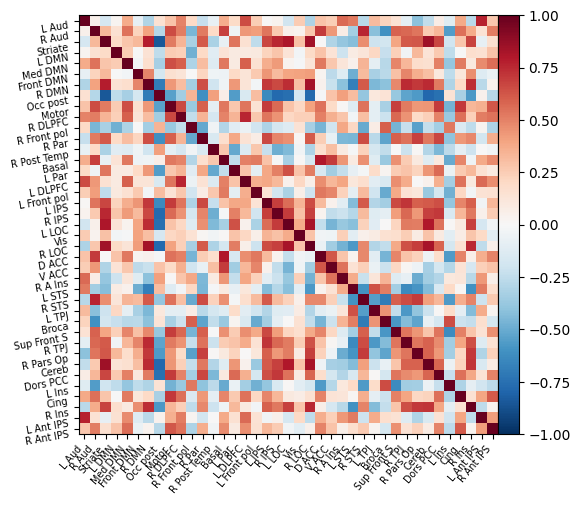

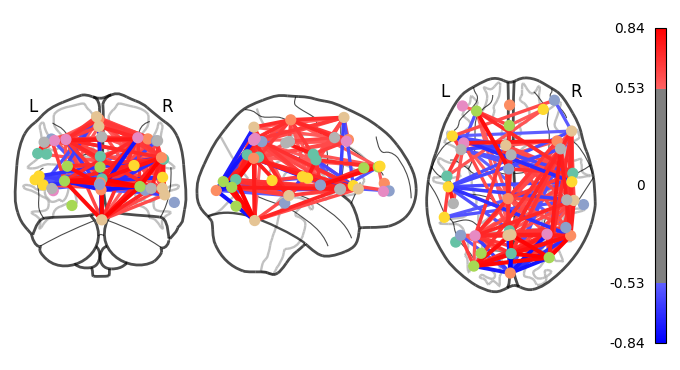

In [13]:
# Partial correlation matrix
plotting.plot_matrix(corr_matrices_fu1[0], labels=atlas_labels, colorbar=True, vmax=1, vmin=-1)

# Connectome over brain schematic
coords = atlas.region_coords # Get center coordinates of each ROI
plotting.plot_connectome(corr_matrices_fu1[0], coords, edge_threshold="80%", colorbar=True)

In [42]:
# April 19, clear command

del time_series
del corr_matrices_fu1
del pcorr_matrices_fu1

#del corr_matrices
#del pcorr_matrices

#del connectivity_matrix, correlation_matrix
del connectivity_matrix_fu1, correlation_matrix_fu1, 


#del(dicom_folder, output_folder, nifti_file, dicom_files, nifti_file, time_series, correlation_matrix, correlation_matrix_fu1, connectivity_matrix, connectivity_matrix_fu1)


NameError: name 'corr_matrices_fu1' is not defined

In [ ]:
matrix_test1 = [[4,1,2,3],[1,5,6,7],[2,6,8,9],[3,7,9,10]] 
matrix_test2 = [[2,-1,0,1],[-1,3,2,0],[0,2,4,1],[1,0,1,5]] 
K_test_babbo = np.dot(matrix_test2,np.linalg.inv(matrix_test1)) 
K_test_babbo2 = matrix_test2 * np.linalg.inv(matrix_test1)
K_test_babbo3 = np.matmul(matrix_test2, np.linalg.inv(matrix_test1))
print(K_test_babbo)
print(K_test_babbo2)
print(K_test_babbo3)

In [ ]:
###


# K between these two time points


###





import numpy as np



matrix1 = male_BL[0] # corr_matrices[0]

# Load matrix computed above for the AP patient
matrix2 = male_FU[0] #corr_matrices_fu1[0]

# Compute the inverse of the matrix
inverse_matrix1 = np.linalg.inv(matrix1)
print(inverse_matrix1)

#print("Original Matrix:")
#print(matrix1)

#print("\nInverse Matrix:")
#print(inverse_matrix1)

#K_approximation = np.dot(male_FU, np.linalg.inv(male_BL))


#K_approximation = matrix2 * inverse_matrix1

K_approximation = np.matmul(matrix2, inverse_matrix1)

# print(K_approximation)


# Plots

vmin = -1
vmax = 1


# K-operator
plotting.plot_matrix(K_approximation, labels = atlas_labels, colorbar=True, vmax=1, vmin=-1) # vmax=1, vmin=-0.8
coords = atlas.region_coords
plotting.plot_connectome(K_approximation, coords, edge_threshold = "80%", colorbar=True, edge_vmin=vmin, edge_vmax=vmax)



# Check if matrix1_approx is close to matrix2
tolerance = 1e-6
is_close = np.allclose(matrix2, (K_approximation*matrix1), atol=tolerance)

if is_close:
    print("KG is close to G^p.")
else:
    print("KG is not close to G^p.")
    

/var/folders/tc/5k6bdv0s421bnc52mnnj7p_w0000gn/T/ipykernel_1454/2919441299.py:32: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  plotting.plot_connectome(K_approximation, coords, edge_threshold="80%", colorbar=True, edge_vmin=vmin, edge_vmax=vmax)
/var/folders/tc/5k6bdv0s421bnc52mnnj7p_w0000gn/T/ipykernel_1454/2919441299.py:43: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  plotting.plot_connectome(K_approximation, coords, edge_threshold="80%", colorbar=True, edge_vmin=vmin, edge_vmax=vmax)


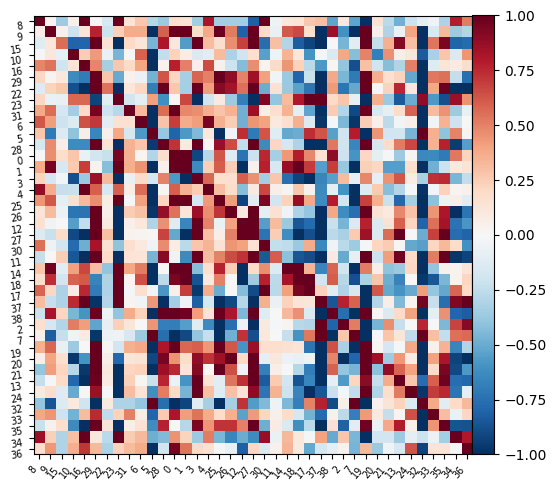

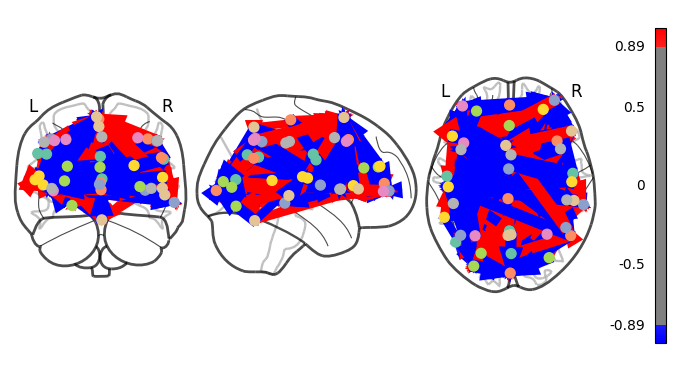

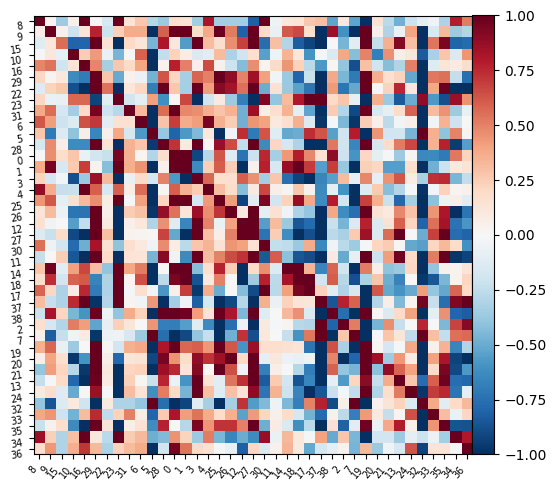

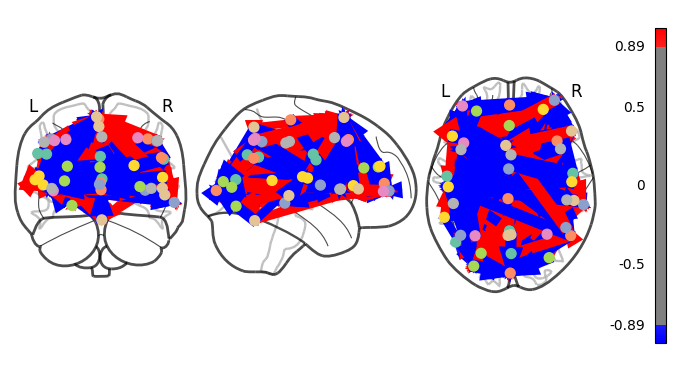

In [34]:
# April 10 -- re-ordering the ROIs


import os
#import torch
#from torch import nn
import numpy as np
import matplotlib.pyplot as plt
#from tqdm import tqdm

from nilearn import datasets
from nilearn import plotting


# Define a dictionary to map each ROI to its lobe
lobe_mapping = { # added: new on May 18
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}

# Reorder ROI labels according to lobes
reordered_labels = []
for lobe in lobe_mapping:
    reordered_labels.extend(lobe_mapping[lobe])

# Now, plot using the reordered labels
plotting.plot_matrix(K_approximation, labels=reordered_labels, colorbar=True, vmax=1, vmin=-1)  # vmax=1, vmin=-0.8
coords = atlas.region_coords
plotting.plot_connectome(K_approximation, coords, edge_threshold="80%", colorbar=True, edge_vmin=vmin, edge_vmax=vmax)


# Reorder ROI labels according to lobes
reordered_labels = []
for lobe in lobe_mapping:
    reordered_labels.extend(lobe_mapping[lobe])

# Now, plot using the reordered labels
plotting.plot_matrix(K_approximation, labels=reordered_labels, colorbar=True, vmax=1, vmin=-1)  # vmax=1, vmin=-0.8
coords = atlas.region_coords
plotting.plot_connectome(K_approximation, coords, edge_threshold="80%", colorbar=True, edge_vmin=vmin, edge_vmax=vmax)


Size of the block-diagonal matrix: (39, 39)


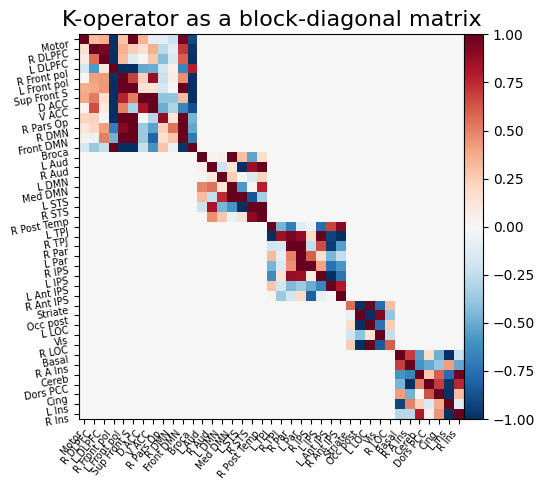

In [44]:
#####


# Block-diagonal representation of K


#####



# Addendum of March 26

import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

# Define a custom mapping to group ROIs by brain lobes
lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}


# Load matrices computed for the control and AP patients
# Replace these with your actual data
matrix1 = male_BL[0] #corr_matrices[0]
matrix2 = male_FU[0] #corr_matrices_fu1[0]

#K_male = matrix2 * np.linalg.inv(matrix1) # May 18

K_male = np.matmul(matrix2, np.linalg.inv(matrix1)) # May 19

# Function to create block-diagonal matrix from submatrices
def create_block_diagonal_matrix(submatrices, lobe_mapping):
    # Calculate the total number of ROIs
    num_rois = sum(len(roi_list) for roi_list in lobe_mapping.values())
    
    # Initialize the block-diagonal matrix
    block_diagonal_matrix = np.zeros((num_rois, num_rois))
    
    # Fill the block-diagonal matrix with the submatrices
    row_idx = 0
    for lobe, roi_list in lobe_mapping.items():
        size = len(roi_list)
        block_diagonal_matrix[row_idx:row_idx+size, row_idx:row_idx+size] = submatrices[lobe]
        row_idx += size
    
    return block_diagonal_matrix

# Compute the inverse of the matrix1
inverse_matrix1 = np.linalg.inv(matrix1)

# Compute the submatrices for each lobe
submatrices = {}
for lobe, roi_list in lobe_mapping.items():
    size = len(roi_list)
    submatrix = np.zeros((size, size))
    for i, roi1 in enumerate(roi_list):
        for j, roi2 in enumerate(roi_list):
            #submatrix[i, j] = matrix2[roi1, roi2] * inverse_matrix1[roi2, roi1]
            submatrix[i, j] = K_male[roi1, roi2] # May 18
    submatrices[lobe] = submatrix

# Create the block-diagonal matrix
block_diagonal_matrix = create_block_diagonal_matrix(submatrices, lobe_mapping)

# Define the reordered list of ROI indices
reordered_indices = [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28, 0, 1, 3, 4, 25, 26, 12, 27, 30, 11, 14, 18, 17, 37, 38, 2, 7, 19, 20, 21, 13, 24, 32, 33, 35, 34, 36]

# Reorder the labels according to the reordered list of indices
reordered_labels = [atlas_labels[i] for i in reordered_indices]


# Plot heatmap for the block-diagonal matrix
title = "K-operator as a block-diagonal matrix"
plotting.plot_matrix(block_diagonal_matrix, labels=reordered_labels, colorbar=True, vmax=1, vmin=-1, title=title)


print("Size of the block-diagonal matrix:", block_diagonal_matrix.shape)

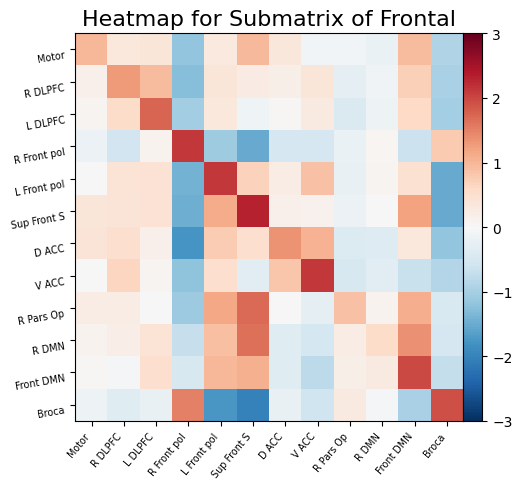

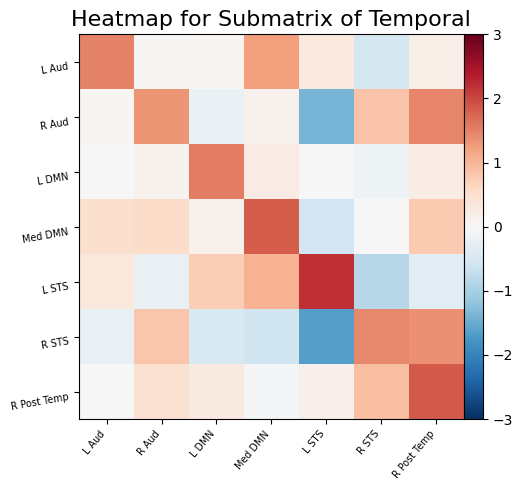

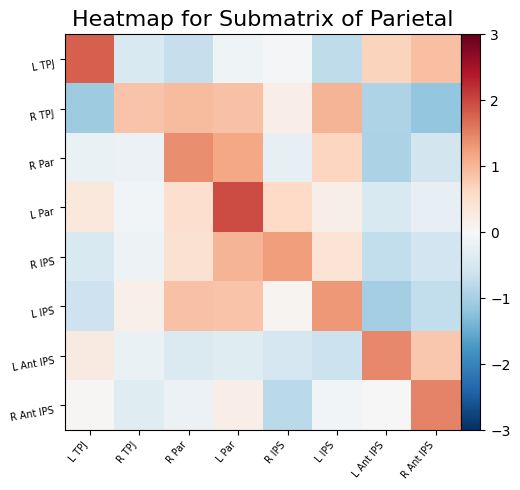

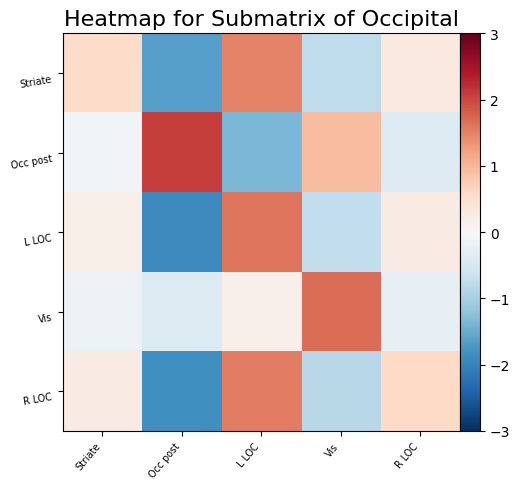

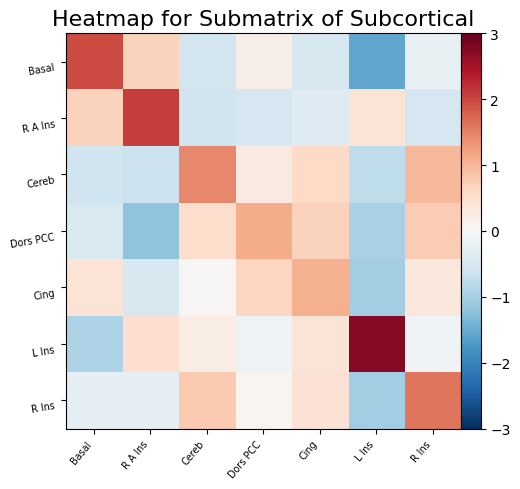

In [45]:
# Single blocks of the K operator


# Blocks: submatrices corresponding to the lobes

import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}


# Replace these with your actual data
matrix1 = male_BL#[0] #corr_matrices[0]
matrix2 = male_FU#[0] #corr_matrices_fu1[0]

# Compute the inverse of the matrix1
inverse_matrix1 = np.linalg.inv(matrix1)

# Function to visualize submatrix for a given lobe
def visualize_submatrix_for_lobe(lobe):
    lobe_indices = lobe_mapping[lobe]
    submatrix = np.zeros((len(lobe_indices), len(lobe_indices)))
    submatrix_labels = [atlas_labels[i] for i in lobe_indices]  # Get ROI labels

    
    for i, roi1 in enumerate(lobe_indices):
        for j, roi2 in enumerate(lobe_indices):
            #submatrix[i, j] = matrix2[roi1, roi2] * inverse_matrix1[roi2, roi1]
            submatrix[i, j] = K_male[roi1, roi2] # May 18
    
    # Plot heatmap for the submatrix
    title = f"Heatmap for Submatrix of {lobe}"
    plotting.plot_matrix(submatrix, labels=submatrix_labels, colorbar=True, vmax=3, vmin=-3, title=title)
    plotting.show()

# Visualize submatrices for each lobe
for lobe in lobe_mapping:
    visualize_submatrix_for_lobe(lobe)




In [21]:
# April 16, test with AAL atlas from the beginning



#from nilearn import datasets, input_data
#import os
#import numpy as np
#import nibabel as nib
#from nilearn import datasets, input_data, connectome
#import nibabel as nib
#import matplotlib.pyplot as plt
#import numpy as np


# Fetch the AAL atlas
#atlas = datasets.fetch_atlas_aal()
#atlas_filename = atlas.maps
#atlas_labels = atlas.labels

# Other parts of your code remain unchanged
#import os
#import dicom2nifti
#import dicom2nifti.settings as settings
#import pydicom


# Other patient: 002_S_5018, ADNI, M, 73.4, 73.7, 73.9, 74.5, Resting State fMRI
#dicom_folder = "/Users/mariamannone/Downloads/ADNI 4/002_S_5018/Resting_State_fMRI/2012-11-08_07_20_35.0/I346237"

#output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_5_AAL/"


# Create the output folder if it doesn't exist
#os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
#settings.disable_validate_slice_increment()
#dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
#dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
#nifti_file = os.path.join(output_folder, "output.nii.gz")
#dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)


In [22]:
# AAL

#from nilearn import datasets, input_data
#import os
#import numpy as np
#from nilearn.input_data import NiftiMapsMasker

#nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_5_AAL/output.nii.gz/"

# Load the AAL atlas
#atlas = datasets.fetch_atlas_aal()
#atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
#masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
#time_series = []
#labels = []

# Iterate over each NIfTI file in the folder
#for file_name in os.listdir(nifti_folder):
#    if file_name.endswith('.nii.gz'):
#        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
#        ts = masker.fit_transform(file_path)
#        time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
#        labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
#for i, ts in enumerate(time_series):
#    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')



In [27]:
#corr_measure = ConnectivityMeasure(kind='correlation')
#pcorr_measure = ConnectivityMeasure(kind='partial correlation')

#corr_matrices = corr_measure.fit_transform(time_series)
#pcorr_matrices = pcorr_measure.fit_transform(time_series)

# STORING the information for learning & prediction

#male_BL_AAL = corr_matrices

# Partial correlation matrix
#plotting.plot_matrix(corr_matrices[0], labels=atlas_labels, colorbar=True, vmax=1, vmin=-1)

# Connectome over brain schematic
#coords = atlas.region_coords # Get center coordinates of each ROI
#plotting.plot_connectome(corr_matrices_fu1[0], coords, edge_threshold="80%", colorbar=True)

In [23]:
# April 19, clear command


del time_series
del correlation_matrix_fu1, connectivity_matrix_fu1
del connectivity_matrix_fu1
del correlation_matrix, connectivity_matrix
del time_series


#del(dicom_folder, output_folder, nifti_file, dicom_files, nifti_file, time_series, correlation_matrix, correlation_matrix_fu1, connectivity_matrix, connectivity_matrix_fu1)


NameError: name 'time_series' is not defined

In [23]:
# April 16, test with AAL atlas from the beginning


# AAS, Follow-up

#from nilearn import datasets, input_data
#import os
#import numpy as np
#import nibabel as nib
#from nilearn import datasets, input_data, connectome
#import nibabel as nib
#import matplotlib.pyplot as plt
#import numpy as np


# Fetch the AAL atlas
#atlas = datasets.fetch_atlas_aal()
#atlas_filename = atlas.maps
atlas_labels = atlas.labels

# Other parts of your code remain unchanged
import os
import dicom2nifti
import dicom2nifti.settings as settings
import pydicom


# Other patient: 002_S_5018, ADNI, M, 73.4, 73.7, 73.9, 74.5, Resting State fMRI
dicom_folder = "/Users/mariamannone/Downloads/ADNI 4/002_S_5018/Resting_State_fMRI/2013-02-11_07_46_12.0/I358614"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_6_AAL/"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
settings.disable_validate_slice_increment()
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)


/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03880291546973622930'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830241253905759924'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03820440539637301785'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03794587022502988526'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841519203169323524'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03865894659939668913'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03824594954526602288'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03771772386375452318'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03822389971210847533'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03770833725740077827'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03817999569435123758'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03829700454115184767'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03777297923906679467'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03847879551126922980'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03761218209226410120'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03792580372468785089'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03791442244802425221'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03788500485037052944'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03872622336627068565'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03868383398355229006'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843288419454800491'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03848738458023831059'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03804913079328956779'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03815226170259988091'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03788795699666741894'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03786591141672860946'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03791593289016752658'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03889982786819814491'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03801295243988466223'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03761319824031857342'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843916317171399900'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03769509133996813584'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838964400460854132'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03791453259691268764'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03829054752117744769'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03814306418141669948'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03811777674596180174'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03771770175459791720'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842086902379741079'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03760304985680379155'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03765023088425564365'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03863470667084568975'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03800219490089604627'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03779105091306500880'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03863663690928866897'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03778091000742633929'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03787178593661059183'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03829934888954013342'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03766653437008975203'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03836933033135898951'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842429128145468242'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03815019982788106194'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03848348377246319434'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830344322582048927'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03865242104503554421'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03871541042389825441'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03777650952349899456'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830306372622949121'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03778903107920851410'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03828414012174171352'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03765145893084609222'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03869700479818993483'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03862052716694151384'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03777834613924735956'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03868339956655775685'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03831513623496257773'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03866758723941040163'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03892879816970376250'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03856517779391355712'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03776753873851672959'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03790532885388065630'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03765945429937993498'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03825009289770494499'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03817175175376455902'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03821012846139458068'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843230544801041035'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843060869730827956'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813482410749890790'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03824170404403036337'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03801557828506841436'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837671910135971733'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03857396337991971899'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03835959646701167871'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03867161996407633375'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03861799284233025886'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03831620909540180241'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03847166145244046708'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03875766321677251019'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813376408635777341'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03816679646312506262'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03794133402882799305'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843889492149115176'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03878156137941482234'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03831486588015441287'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03840715826379122943'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03872871143600278385'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03784349135854723822'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03822093437712789409'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03814324398280035782'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03890478331750763703'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03759738924212343074'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03826598274481831630'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03811090360130507818'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03800361279599489009'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03825755524983936538'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03869301444798163825'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03810982571225297220'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813627073910822306'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03800379005922953490'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03786830107892165570'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03851274926579852925'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03796114770837606546'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03892581896335852512'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03760840439187275760'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03836544004657162050'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03798106608543615234'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03825719494677630316'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03765911146539453432'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842092054272085788'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03802426710997288933'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03825377378726760099'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03895675387119604954'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03817021391859594298'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03866836744158899311'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03777014596236074937'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03794842799156708849'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842540820503356578'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03780688852135102165'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03789527708525066075'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03852451217235985930'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03820982891060108571'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03857109217762951100'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03759310737030467456'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03766100239410080495'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03790827245342778125'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03828667034128403410'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03869274702336695343'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03867102924837433442'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841891532222695625'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03791017255537973898'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03866966423296045421'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03775846027212000938'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03814345794571404512'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793655603533911084'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03802086458933673040'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03875879973820369513'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03869542292003646937'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03866304902982573473'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03812127175246589085'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03843182300793947448'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03856046985088728497'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842284357398159767'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03786493258734420475'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03803913604660556419'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03867840571733023884'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03870227478613557610'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03823319771779922021'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03786066502989298801'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03810447969045701560'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846332136255061784'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03804968362352570838'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03826047858234535046'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03868397913458546009'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03865488649888083330'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03805293156204739430'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03854410754095612538'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03765887569050390264'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03777322482493072962'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03768717383918234572'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03894160509884799220'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03788390935403209690'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03844741467398470393'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03804333006332564730'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03789378948559562881'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03832345117494547292'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03870013838425193022'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03841400606939236481'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03794536840447930523'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03805623649530876472'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797832016279752013'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03840401131991900787'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03876572717937927403'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03803654048117918207'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797912971580035249'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813892223710276281'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03820245066190621544'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837234906299464781'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03786700130815725746'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03878259510886603970'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03804597461390726303'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846108742173622587'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03795590100330179160'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03855473653186084802'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03802767066341621528'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03856451183803589603'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03805438078287122696'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03852968362814200656'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838895486771732218'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03782005664041956678'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813373904554352760'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03844978468433712253'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03840397182093747930'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03812612162775235499'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813701379186699259'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03780719021335991074'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03823478121963468143'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03778648802653016422'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03821547815942605245'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03802809687707797307'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03788387199862433539'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03862761057137607772'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03819537802103306048'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03824351431430775960'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03850060018490002813'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03840699955847363744'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842243489735644071'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846065606210377667'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03855634406047989868'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03821240000581415868'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03821251092335522450'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03805242347436518654'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03762951016931083532'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03801924113372368873'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813412672435721377'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03847321749081547561'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03855583260152526671'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793380780935266361'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03816244217474248726'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830585639308834569'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03876490267978199148'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03800550379854788967'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03876692009666085044'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03839918988784350274'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03881775761086411384'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03824845600914763051'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842269478395996633'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03849709975840290183'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03845346661590178085'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03880171818655879374'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03864281723165635890'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03795483211251289284'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830032854043241377'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03862108093414721951'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842263296216421126'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03825732628420474788'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03809648279320805611'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03855490091746410258'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03769222070426872797'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03817588278995079741'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03890681245913419178'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797059366560460960'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03758603330513162754'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03785645091379013201'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03789759588242428411'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03803803994883841418'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830550249179944871'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03893838560810064684'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842938154760292231'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03866251737998723388'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03816243228428707933'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03795051484527047156'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03855301009204415120'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03816607881667648161'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03826535103848196176'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797037006003109903'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03797132681254831510'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03863614710223577000'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03882760424515358968'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03851615303189239820'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03812052558978589750'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842695689767719373'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846921830380808170'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03793732213087634677'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03867410599464663355'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03850363325908934757'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03875988083843550330'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03846167064498091823'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03792119435464492027'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03840549154374979444'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03838065133869222840'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03842110601166030006'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03866074040403090913'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03799705755239807611'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03852394778126038394'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03857635805081871371'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03863481708940313777'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03840376684584535230'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03845368218713102236'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03830606321580015173'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03854677303522529497'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03827514772984877101'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03766815783576149266'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03816628446105514150'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03803530844580760612'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03795548423436212775'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03856095638346898495'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03863456235987010607'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03878466776332403633'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03759889956658727624'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03853176297776859978'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03850718832916636661'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03840749164144612049'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03890929823665782510'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03805417646504172695'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03876501046241259036'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03803799291107837556'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03811473236882678764'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03796425631038007824'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837620692114618304'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03813771650367494129'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03763382030103434954'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03817775952270539288'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03849148859194427418'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03814089070041297733'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03766871620822308142'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

In [37]:
# AAL, follow-up

#from nilearn import datasets, input_data
#import os
#import numpy as np
#from nilearn.input_data import NiftiMapsMasker

#nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_6_AAL/output.nii.gz/"

# Load the AAL atlas
#atlas = datasets.fetch_atlas_aal()
#atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
#masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
#time_series = []
#labels = []

# Iterate over each NIfTI file in the folder
#for file_name in os.listdir(nifti_folder):
#    if file_name.endswith('.nii.gz'):
#        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
 #       ts = masker.fit_transform(file_path)
 #       time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
 #       labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
#for i, ts in enumerate(time_series):
#    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')


In [31]:
#corr_measure_fu1 = ConnectivityMeasure(kind='correlation')
#pcorr_measure_fu1 = ConnectivityMeasure(kind='partial correlation')

#corr_matrices_fu1 = corr_measure_fu1.fit_transform(time_series)
#pcorr_matrices_fu1 = pcorr_measure_fu1.fit_transform(time_series)

# STORING the information for learning & prediction

#male_FU = corr_matrices_fu1 

# Partial correlation matrix
#plotting.plot_matrix(corr_matrices_fu1[0], labels=atlas_labels, colorbar=True, vmax=1, vmin=-1)

# Connectome over brain schematic
#coords = atlas.region_coords # Get center coordinates of each ROI
#plotting.plot_connectome(corr_matrices_fu1[0], coords, edge_threshold="80%", colorbar=True)

In [32]:
# AAL, submatrices of K only concerning hippocampus and fusiform

#import numpy as np
#from nilearn import plotting, datasets

# Load the AAL atlas for labels and coordinates
#atlas = datasets.fetch_atlas_aal()
#atlas_labels = atlas.labels
#coords = atlas.region_coords

#atlas = datasets.fetch_atlas_aal()
#atlas_filename = atlas.maps
#atlas_labels = atlas.labels



# Define the lobe mapping with only the specified blocks
#lobe_mapping = {
#    'Hippocampus area': [36, 37, 38, 39],
#    'Fusiform': [83, 84]
#}

# Replace these with your actual data
#matrix1 = corr_matrices[0]
#matrix2 = corr_matrices_fu1[0]

# Compute the inverse of matrix1
#inverse_matrix1 = np.linalg.inv(matrix1)

# Function to visualize submatrix for a given lobe
#def visualize_submatrix_for_lobe(lobe):
#    lobe_indices = lobe_mapping[lobe]
##    submatrix = np.zeros((len(lobe_indices), len(lobe_indices)))
#    submatrix_labels = [atlas_labels[i] for i in lobe_indices]  # Get ROI labels
#
#    for i, roi1 in enumerate(lobe_indices):
#        for j, roi2 in enumerate(lobe_indices):
#            submatrix[i, j] = matrix2[roi1, roi2] * inverse_matrix1[roi2, roi1]

    # Plot heatmap for the submatrix
#    title = f"Heatmap for Submatrix of {lobe}"
#    plotting.plot_matrix(submatrix, labels=submatrix_labels, colorbar=True, vmax=1, vmin=-1, title=title)
#    plotting.show()

# Visualize submatrices for each lobe
#for lobe in lobe_mapping:
#    visualize_submatrix_for_lobe(lobe)


In [24]:
# April 19, clear command



del correlation_matrix_fu1, connectivity_matrix_fu1
del connectivity_matrix_fu1
del correlation_matrix, connectivity_matrix
del time_series


#del(dicom_folder, output_folder, nifti_file, dicom_files, nifti_file, time_series, correlation_matrix, correlation_matrix_fu1, connectivity_matrix, connectivity_matrix_fu1)


NameError: name 'correlation_matrix_fu1' is not defined

In [25]:
# other patient


from nilearn import datasets, input_data
import os
import numpy as np
import nibabel as nib
from nilearn import datasets, input_data, connectome
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
from nilearn.input_data import NiftiMapsMasker


atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps
atlas_labels = atlas.labels

# atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')


import os
import dicom2nifti
import dicom2nifti.settings as settings
import pydicom

# Define input and output directories

# PATIENT: 019_S_5019, AD, F, 63-64,Resting State fMRI, v11, v04, v02, v05; we consider V04 and V11

dicom_folder = "/Users/mariamannone/Downloads/ADNI 3/019_S_5019/Resting_State_fMRI/2013-02-11_14_39_50.0/I358811"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_1/"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
settings.disable_validate_slice_increment()
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)


nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_1/output.nii.gz/"


# Load the MSDL atlas
atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
time_series = []
labels = []

# Iterate over each NIfTI file in the folder
for file_name in os.listdir(nifti_folder):
    if file_name.endswith('.nii.gz'):
        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
        ts = masker.fit_transform(file_path)
        time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
        labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
for i, ts in enumerate(time_series):
    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')



corr_measure = ConnectivityMeasure(kind='correlation')
pcorr_measure = ConnectivityMeasure(kind='partial correlation')

corr_matrices = corr_measure.fit_transform(time_series)
pcorr_matrices = pcorr_measure.fit_transform(time_series)

# TO STORE

female_BL = corr_matrices


/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0523289350919475132'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05312028905822313000'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01810897284456849148'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08084428046266005746'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08116025784091640651'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04116120024090258711'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0137303792305399111'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0297383790112470431'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09220416259551291671'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01469846216587324855'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.033589773063461290'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08990640031414983726'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02144851723462772955'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02798601942652610945'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03001730243910766538'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04950726293292889985'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01646874064934489781'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.018727809430056762'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01516430938759290944'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07467999136983539740'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08046210606745555709'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08910685184655031397'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07492426785587327119'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08577721254206233770'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07299197517774169554'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04839581659680479616'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02938029235002052254'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0462493282055924102'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03270326883577504140'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07821420583620927411'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03921061390887996226'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02278548600844806854'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06308031822100236752'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04017093138022333289'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05844385461549635343'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02178731957604864195'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04652097117220675486'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08121036102104287647'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03446956473729037580'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04558915479401780807'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08877176072954060637'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01442107944019923431'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01557430529640982647'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01129392488063395751'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01506346392195312142'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0191947749413786010'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08194541467001259588'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07160856301422365222'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05127214781058128228'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03757883724219480562'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01601639781814683773'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05555181553048981439'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04196854407751938579'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01844984003621321080'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01211900352206661055'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02096442981009461554'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0784591195148613982'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0539395235798327015'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06122922502831775748'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05797262217147235020'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08369848941609043810'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05344342108400712380'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03878815448280683946'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0245267253221586937'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0390933230716464998'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05807455110115098955'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03925454364422210804'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02139824113871077791'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03196915910604686481'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01735019592661381424'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07990194285729934871'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01776679829839772812'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03537335966426370331'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0695811664631814361'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05201580095274383493'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01148861056100989555'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08578696902180450363'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01768053115160634316'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07882683736907709531'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03806657401237185726'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02065616055887521420'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01231320537608651103'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03320769521753354848'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02836442450557095339'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08817058124969860576'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06310473611487776389'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02083394294177493163'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01285608905760013760'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04180772016624172237'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02942392872122989730'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01600842685253428869'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03999213522884963035'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07204526496580044765'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01624678573032412814'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09160655306659834799'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02149461953815262385'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0405292162324220104'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08061789010585509642'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02341663909813414257'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03924905357112642516'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04693045688378755516'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07974855237825084187'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04142019473833024679'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05936933182345940762'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04897148725967778437'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06452370609837613574'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04845972963374298902'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06161620483822208520'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05797598361711866771'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04017847656751151644'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07391475850310083709'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06099785300149692540'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01155587999140422476'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0755850336278086254'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02053045122750399006'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04692007190962388804'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03391142756612060272'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09138421080269978333'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01028164010815536038'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08105780746200791682'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01395059909325137348'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09050338743643123612'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08742627010531950813'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02821177949830940902'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04264270781281601109'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03421916526714271401'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06048652152388022833'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07502616180293307168'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07589004526378098999'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08571489067739158150'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07746350361719182522'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03110717903979752047'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05467687537550876849'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04727865284744684083'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03590048932727103498'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05900737764840051598'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05776081864093776525'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06779995087767570984'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03040542169037593752'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07953026545018370806'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02611040121071430304'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05224669519963914137'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06212462303461723208'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03005158129144517581'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05756817268252130130'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08830615805319203196'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06219687216395224599'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06195793107717971520'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03596881551570334253'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07656211377985405171'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02499839521591505430'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02539577617327415578'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05919551070886663597'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01326473594720710860'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07130883998135591793'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05062910004399052814'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0665151387343485686'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05937213235357201508'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04603923502519316191'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0404903650259170765'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04479647725745331833'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07506549225638072287'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05385192389723746647'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05745855291749493864'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02809141843627436039'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0569216140144069191'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02333981362642653170'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01212652879799563462'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0182346075381519951'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08319915471141980304'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0709215441167884293'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04303619347844906124'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0558232040220626820'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01520995226866216585'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06239372186776365069'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07139638473919715206'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06773513668664470723'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02648994842793003798'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01988689220837003111'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07539574410886409308'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837318050783106435'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01409485606560188036'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05729194570163905134'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0297825201440317146'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06532259389039049742'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04336107285898286732'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07644406574266317118'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04693052905051305023'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0346732923951440608'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0411036955829839445'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03623045787774629684'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07739930590605039711'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05441827598238308046'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08303060294766327101'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05119293690128252836'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0916008294173986567'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04837495438565063105'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04994147878314208910'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02395259753376973468'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06093502294065590179'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02444737878844724158'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0408652085119969569'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01395019769503479953'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05761682960682647855'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08737796012696952275'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05041897711813634181'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07349460967023368907'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02970900181800114447'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06817425523865969811'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02193596119078281092'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0471972522484589611'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02376777199149263750'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04388535036181608622'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06051471970701758542'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0569641248137726448'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02213822709567412695'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06006870303332595752'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06971739714596786798'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02695341973916243303'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06451752149972320248'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0710443454575084732'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0918646287645766360'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08715054277717855303'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03968730537110285407'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04333363883519042963'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08856205105993875630'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01815848290826454798'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07783800793521167522'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0400115342530027333'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03076937977479563486'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01418994661729849970'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07201632771831474280'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02792223132300409682'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0911019836042917623'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0867921118187767955'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05747990894318172433'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08207692238066813553'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03993995617102601512'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06001674470489848483'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03185581211590938680'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09205952535802965576'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05299830333899574986'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07130944385644818991'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0442928889400432931'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03141401312856370160'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06186460448791832513'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04279141243805190713'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06093666349626220137'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01438166099538808561'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08309355907916668032'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0700366971849952661'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07721647196733644705'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03357766218247048866'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0510172785156030189'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0675478597289942704'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05603745077000704064'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09166163644721166215'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07019933727166493177'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04835549349570567722'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07957739777198972971'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0354184138569858729'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

In [26]:

# April 19, clear command

del corr_matrices
del pcorr_matrices


del time_series
del corr_matrices_fu1
del pcorr_matrices_fu1

del connectivity_matrix, correlation_matrix
del connectivity_matrix_fu1, correlation_matrix_fu1



NameError: name 'corr_matrices_fu1' is not defined

In [27]:



# FOLLOW-UP


dicom_folder = "/Users/mariamannone/Downloads/ADNI 3/019_S_5019/Resting_State_fMRI/2012-11-07_13_45_02.0/I345555"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_2"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
settings.disable_validate_slice_increment()
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)



nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_2/output.nii.gz/"

# Load the MSDL atlas
atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
time_series = []
labels = []

# Iterate over each NIfTI file in the folder
for file_name in os.listdir(nifti_folder):
    if file_name.endswith('.nii.gz'):
        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
        ts = masker.fit_transform(file_path)
        time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
        labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
for i, ts in enumerate(time_series):
    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')

corr_measure_fu1 = ConnectivityMeasure(kind='correlation')
pcorr_measure_fu1 = ConnectivityMeasure(kind='partial correlation')

corr_matrices_fu1 = corr_measure_fu1.fit_transform(time_series)
pcorr_matrices_fu1 = pcorr_measure_fu1.fit_transform(time_series)


female_FU = corr_matrices_fu1 



/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07261517328538977666'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05312028905822313000'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08948997258513855346'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydico

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01567404047102302304'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07270809238111757915'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04550490068557675319'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06354184718879421999'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0870274929100184226'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04586841492323455847'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03828462743436204539'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03544038883513044518'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02533904042894197005'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02031460794935433602'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04440185732903533584'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07947335544324984863'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05315545303822582668'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02537346860957659827'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02223082849969370364'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05722166361590571385'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04761362235137100875'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05492078493127226986'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04381869747835969409'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05028541685642685905'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0978522166575799257'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0558753940471706071'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06548533884584710326'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02568630733684983247'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01491274218728290166'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09157766447396145099'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07428294189259762038'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05549992660898410768'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0888407790989360112'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01170085545103354483'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0308214318738271372'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07729500567626185851'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05987329525948974391'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01482829821679955638'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0852450048829242357'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04663738078153169588'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02545144452015813288'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01383975081978635043'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02001302506864344957'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05895640167555096834'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01197300596689622358'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04665289566183301921'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05982743522504861089'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05181209881536721119'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04150255111138851594'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05683680516889944877'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06378166582710122019'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08149186861358790187'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03161059683734662521'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01507918960269026731'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06807535690907349560'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01024339560067902097'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08877920360028534262'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04109559572936831248'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08872624611850759089'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0980837034624076605'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08968957623861277246'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01403546097554133001'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05685591082361295537'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02620729803444741790'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03293068122478154369'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04966015953698700149'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05994833201826076095'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02017556550670253585'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02982905904014579815'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03298556012890874361'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05794793601541229566'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05365535120542503077'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03632644098665141256'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01521622787891413938'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06829422355013765034'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07902393623640603262'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04437835110875984667'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06273274303649695452'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02990018663969586053'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06912961529882882182'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08787595126972301965'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01161090091402557677'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08061004958920326550'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08139972117000306813'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06301196151956744068'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04488621875016238881'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01121035682426068816'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0293476134607769007'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03493891377504241567'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04217282618684075339'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07862630847752191014'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03765261473026163495'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03683685716465561102'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02784405212744638024'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02201542607593447855'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03104937149578180601'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08222469266533107335'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03819269983262860542'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02381195472771810712'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06998284815623388671'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04496763850208235944'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08018348518031192235'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01181341537692454931'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01135136631137978737'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05666814481144708433'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09093111492674712696'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02034940637218002053'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04418675218304263833'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02004908120252099009'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06799262357115120811'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03811572997197027484'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02674955915858808194'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06836221046697822523'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06945525867351909067'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04862739966500123542'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08360034055545192723'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04694833646667765959'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02440952138421129826'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08216572593588128823'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03615207971254381531'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08938873137201938471'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08163807215603950463'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06729741073899362424'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08157981074673850011'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02850845899715218604'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04387567208584150655'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0493411930703192339'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04166066599179952174'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01056092501766421614'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02631788436349105462'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03026082705571399771'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01243657429233739703'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08820162583114550750'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02608100252642495486'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08547484597666368846'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05629573209545602800'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08253993441934501939'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08561692678477671992'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01819286192775398138'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05575260875308231466'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05191170652720152101'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04889820126565096889'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09053331944275619953'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06092938979946638548'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02533428368736659086'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04628727553073428475'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08968055765735974297'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01323495953983860397'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0365048236588565727'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06495398916515555720'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05468600421475265132'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0555918311457071620'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0912940768192172050'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02500909048376653237'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05983556553805310752'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07915849063606647473'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01899681541182912956'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08352605917336963216'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06722885045818209228'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02238354138577243897'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03380339600516041735'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04029489482282135107'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.066759217120979751'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03602512942342284305'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0194488978586703552'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02040388878154270729'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02252730956819439619'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0606489666697788571'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02567540736130071877'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06933357011723015498'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02365695473849949962'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08811370209356015977'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07007434542566298088'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0315480790089627472'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04027264552884354264'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07073004498544835151'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04702250093937631919'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03231230703391282291'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01305732008661998665'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07612686951934685782'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04016219179470759990'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05580115529601236555'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04617240339145072195'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09120415913592805072'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03849543288729605642'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03819371759472616227'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0631413406648148042'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08778356568128576438'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03520011263190395923'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03769650627609799483'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06933901742822319539'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07135408043596119608'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0277115905061974632'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0902787546082348372'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06269814966129913583'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02214660510460116713'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06452381717350277529'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07638174329069459585'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06091943649010921185'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06213963838559610815'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08197238625459625409'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07240784999187964880'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07958504548908507877'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0625536506748322628'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0936337533673089517'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08976973579269391768'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08471799280755160140'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02895733338641177100'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06314265362970278634'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02390098696461860958'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05022280325172874430'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07496479761784131783'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02194235923396481194'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02980943629433432748'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06899223093112111607'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02255561873310509851'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02461328570231499676'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01121795361021031394'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01282015274138063774'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03837014225432387019'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05735886784630040529'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05694216845306906568'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06104271717289740463'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01464730492436304758'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02210113463500298926'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06810461022022888464'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04334011148253557930'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08909608380000739569'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01796451052896169712'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09173820699837677502'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06131460702458227589'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0435331331943329080'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03756150374370622362'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03061939933888259809'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03517969727053313857'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05470910581892857042'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05560608446761687922'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06551919093812279402'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01324366737025641849'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04787340328222857657'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0318940723669278070'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0984890760694708641'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08782846481165312084'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06518230988944177881'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06015625693538399783'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01410698549248188753'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01947487332413807327'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07222222178219696894'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08855421648813555250'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02931149311394278224'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02275890610379095653'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01148665854571041069'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01896223584563174015'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01691112344717469639'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06011764726629244961'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07016884344045586673'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04720483793140263196'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02866037460000619891'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02367267723125441579'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0835081272190206467'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07413025293172637312'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06120387672273905484'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05847357939910736727'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0246631647654782698'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04875558558457961633'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05836868889012333752'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01883950576355499518'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08600755977904988373'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04771054115091883034'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02434860227524352723'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02032250686752401365'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07478166329462516619'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02088468596175483210'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03823458190516247925'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03321759875845583164'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05623867926989140049'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07235784834468369051'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/nilearn/maskers/base_masker.py:253: UserWarning: memory_level is currently set to 0 but a Memory object has been provided. Setting memory_level to 1.
  return self.transform_single_imgs(


In [28]:
# April 19, clear command


del time_series
del corr_matrices_fu1
del corr_matrices
del correlation_matrix_fu1, connectivity_matrix_fu1
del connectivity_matrix_fu1
del correlation_matrix, connectivity_matrix
del time_series


#del(dicom_folder, output_folder, nifti_file, dicom_files, nifti_file, time_series, correlation_matrix, correlation_matrix_fu1, connectivity_matrix, connectivity_matrix_fu1)


NameError: name 'corr_matrices' is not defined

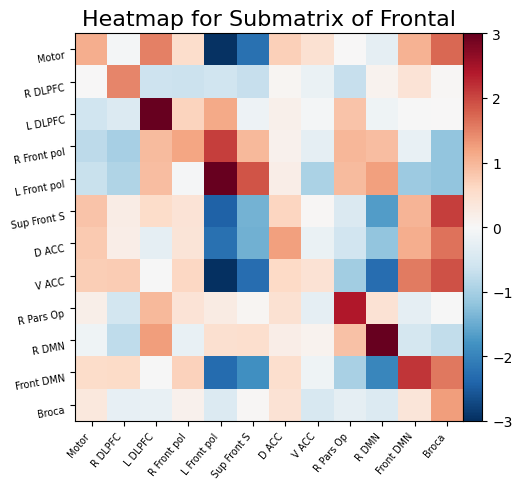

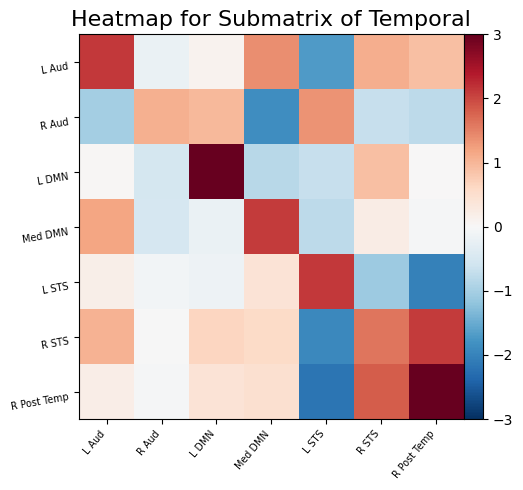

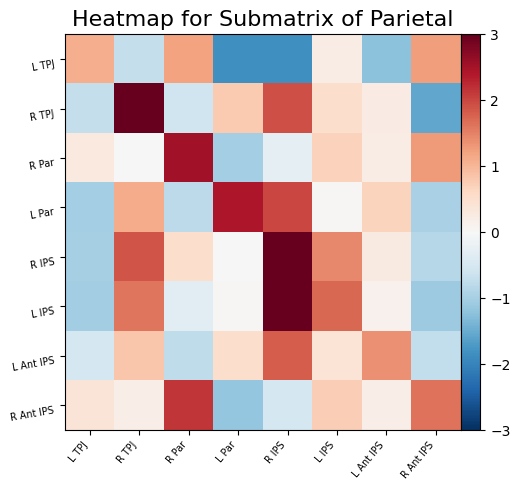

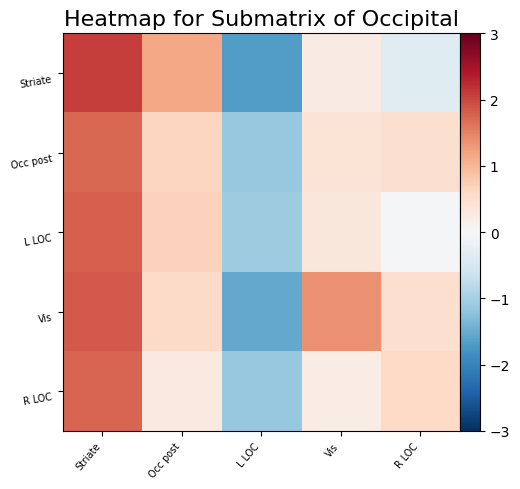

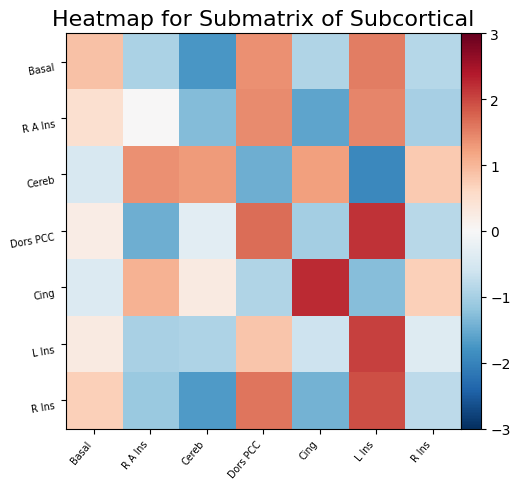

In [29]:
# Single blocks of the K operator


# Blocks: submatrices corresponding to the lobes

import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}


# Replace these with your actual data
matrix1 = female_BL[0] #corr_matrices_fu1[0]
matrix2 = female_FU[0] #corr_matrices[0]

#K_female = matrix2 * np.linalg.inv(matrix1)

K_female = np.matmul(matrix2, np.linalg.inv(matrix1)) # May 19

# Compute the inverse of the matrix1
inverse_matrix1 = np.linalg.inv(matrix1)

# Function to visualize submatrix for a given lobe
def visualize_submatrix_for_lobe(lobe):
    lobe_indices = lobe_mapping[lobe]
    submatrix = np.zeros((len(lobe_indices), len(lobe_indices)))
    submatrix_labels = [atlas_labels[i] for i in lobe_indices]  # Get ROI labels

    
    for i, roi1 in enumerate(lobe_indices):
        for j, roi2 in enumerate(lobe_indices):
            #submatrix[i, j] = matrix2[roi1, roi2] * inverse_matrix1[roi2, roi1]
            submatrix[i, j] = K_female[roi1, roi2] # May 18
    
    # Plot heatmap for the submatrix
    title = f"Heatmap for Submatrix of {lobe}"
    plotting.plot_matrix(submatrix, labels=submatrix_labels, colorbar=True, vmax=3, vmin=-3, title=title)
    plotting.show()

# Visualize submatrices for each lobe
for lobe in lobe_mapping:
    visualize_submatrix_for_lobe(lobe)




In [61]:
# April 19, clear command


del corr_
del correlation_matrix_fu1, connectivity_matrix_fu1
del connectivity_matrix_fu1
del correlation_matrix, connectivity_matrix
del time_series


#del(dicom_folder, output_folder, nifti_file, dicom_files, nifti_file, time_series, correlation_matrix, correlation_matrix_fu1, connectivity_matrix, connectivity_matrix_fu1)


NameError: name 'corr_' is not defined

/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02422980479881858656'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08409762046509091250'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04601643900729870359'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydico

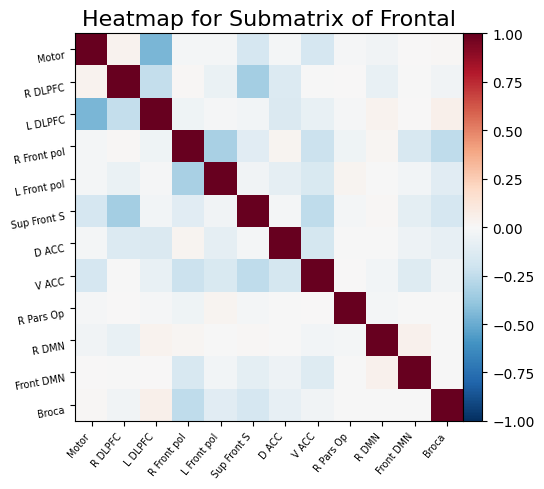

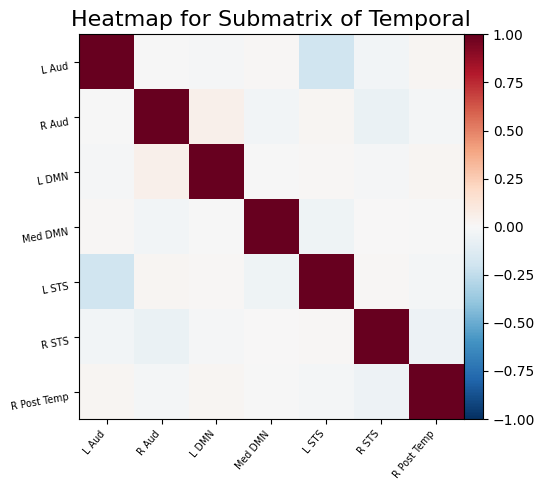

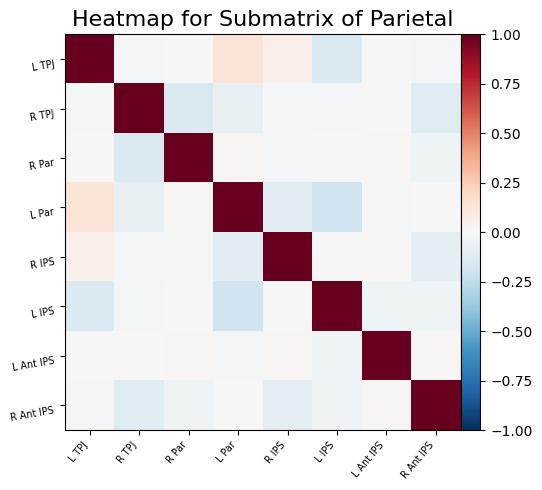

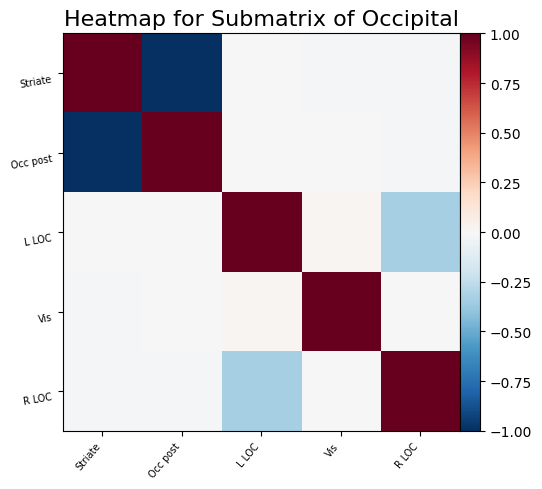

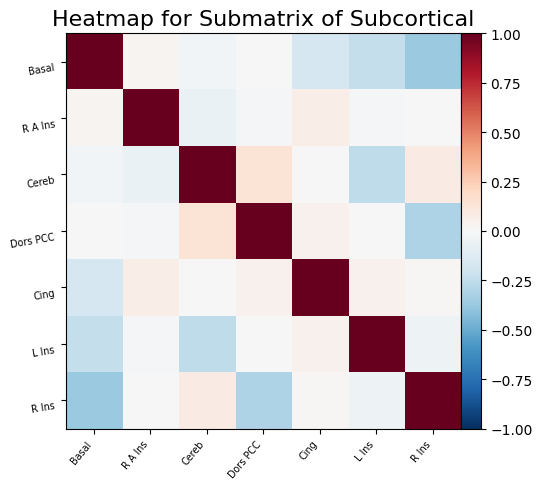

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04179497765589325253'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01941843107742134488'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02437460039781593815'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07088050714629268914'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06467433745964767924'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04041848043094076503'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02518071503794341840'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07799593210431092279'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08666817559747142553'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02175415829491800556'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04414812343171300510'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07952039029018846403'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05553395287476567448'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03458020837482472052'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0882190732756358583'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07497591519697006811'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08903693239469138504'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06092409329538193723'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04944202902819587808'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02790278898773808861'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07290940281153928205'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08895618524421463319'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08729989119446727094'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05534712796342314816'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02018307663258320314'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03869924246536450551'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04328093738651277640'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03388449378003575720'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08133006389911346180'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04847549866991388031'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03042782861278517307'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02637476110145813793'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04356984425785912917'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06964732230193409929'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06597469639778081767'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09013566518299076124'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0357403926324933489'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0349572640531704782'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01087680774616380482'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02345170217029785858'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01139611564596545'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01932658495823305098'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pytho

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06263711047369556011'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01209614470349807203'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08936767475917018382'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04387919934890781151'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08906929740715953997'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05333615318956321280'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05533424801536825917'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02590888853001933686'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08294552836377194124'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05002792144187376397'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08059586833878337898'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04058169622793887952'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06860811619277665697'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06321660834725320860'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07792690656221873830'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01309568105800273190'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04180582632654934095'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05407031277687428258'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02857152398549621383'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05433675384099263118'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08367460255245548098'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01569059798666185709'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07438645053795576569'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05194035822584288021'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0321642173093233565'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07894583230947338187'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04358485452807440301'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06602604224011964988'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04356702966941523473'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01285137453216698158'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01991440214387764156'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04891905922549251983'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01464315811242834753'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09178445707151516241'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04256756847174890885'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08418524047441184486'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08790201590481253438'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01206804681929711604'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05187207104044337655'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04729004230327755088'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06422634481365255148'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03085707054606553380'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08268822376381256201'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07625813331510527081'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08350890607961796478'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08741279151787455668'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01856690424748091783'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07101257872256333917'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05546883508542032062'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07612367775357199746'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06737099423952353653'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03579962100165101158'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06328497843004139604'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03282707101019070354'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05262412564930782059'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02892151074141408129'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06694010047060299961'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05789420879869751813'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06417101828761358548'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05709878284814258123'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0799340525071097148'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05301017438669617717'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06888677234600167535'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04459640474052804876'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07078454775097670267'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0452632485443624939'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02889189434866933331'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01065549453632028182'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0483162829490198000'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05209189829290244035'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03524339124097672590'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05515983611973202351'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05260210112080300974'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06449213641012203962'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04461069335528042424'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09189763678518379800'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02444510891895058088'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06071405008985356627'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0444228222597682445'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02732094915371848995'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03083361887451519627'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03339044487583597985'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08309545943381929625'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06146470619655152567'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06339635807385832902'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05953055735883201904'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04572153694805744912'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04291092340787444235'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07409737215280136846'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02074429225583560726'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08029169357962683190'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02755224608267302768'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07077888883844768762'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01548115359367267507'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02158946778561143162'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08985420558532000306'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08415567607124775483'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08578082044926488893'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07278837504485859079'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0555698178700633064'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03934198046344531928'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08833634480736930369'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01231054379144412314'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06919395188301501076'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06535245625000084785'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01740477404693246811'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03439174006620881172'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05643611611658596675'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08291076225875997741'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02252069237730738014'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08975644453667618160'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0935258108942632181'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09045286943292701601'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06805337592689712437'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07389423772300588102'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07703514052897073124'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0152454527468490891'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04643525655758093058'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04938040909748368426'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08308450289146205741'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03067061517606157956'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06620635560481742445'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04339189394029488747'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03132842751670932500'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01468124032323391005'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08066995983803073906'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02175147662986271409'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07550248123404657721'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02327561485661273307'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07141439494288885689'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08053098831228950367'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07156145598744963155'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03478910966469628790'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08464158789593523856'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04153813733497067471'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02888984328975703570'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01407787541309511187'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04977629762247274334'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0747588270774919482'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02949288363681654780'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05804535087043670358'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01795809148455238672'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08609192796319235459'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04905655224218228842'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04389169824543370563'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02378748793188940127'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02258201368385040853'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07812559992147679272'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02387832954143006635'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04570596891010112158'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01877832412289375041'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01585050451864173773'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07518871568714364936'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08867982543100057047'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03655484687046944930'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03326506623313345935'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03029285217540485516'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04655294075293837784'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07598213084958497350'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01038020781244940402'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04926872468068477781'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01516671368196789530'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08377219453693506274'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08096369207996600211'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04054704434114610084'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08011383022371222577'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04291961202918403277'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02656276464278224436'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08433139782551433827'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07400560430645049051'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07433231815205550777'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04196475713375304491'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08983278193885019871'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05555480018782184647'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07471170408697328459'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03100244020561635050'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0866726014171696573'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0181550207177841468'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01534406517232856639'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07508790444331846594'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01607838281016597334'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05901762592658875617'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07965670304911717991'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02381812151187064605'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01916792048288385276'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02309083088734430499'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06567604682425326334'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0503240530899227495'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0917640440686975774'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04076852518735126993'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09083384023315358372'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0733358679558361368'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02272665583886208224'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0745289354469308732'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02375990610547302658'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02647639039061222063'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07249602237647050504'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08776574968414416775'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01431104859650785609'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01204044343111315125'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01492029573985399250'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06455161856917148727'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02435269002986048062'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04631684263814383579'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07035598758722378932'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08115072943150525872'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06318064652306702498'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05091137225122239129'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05201633015834385943'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01177100695340993708'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05653995399982583225'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03789635799499753976'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08329327156614996422'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01281052109339236970'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08572558436080470808'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04203188885521743403'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01110798185807248773'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04767310678728052055'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01852509877788490554'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0949087369436693395'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05933656154212251896'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01885633219034510345'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03116341859829292107'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06064665910201056317'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06273490408495346725'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09051302941924713074'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06793888840286390944'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01103131583993845230'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08576543355007057715'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04529465622336902466'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07845664293673019297'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03407175410128635228'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07399381103691075587'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04454792071648781038'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02262962469222534747'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0472872330458640456'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06772733419132256840'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01947994145254019878'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03998995283299064215'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02040639008567902650'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04626806706976365347'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03940236252380601103'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09055973898643569104'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02507993928225411734'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07173055857429174638'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03546469003207233071'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06664449111762631587'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06864195124086779983'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01590312495105170768'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04739061822818117691'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09027844298691735520'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05713558259603401772'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08418049554583290571'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02769388618805276817'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03381384345555002400'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08576441680751789460'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04601949030098615103'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06420671160034772649'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02750951721487662526'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05635173624541939497'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07036049536231025924'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02790893119002493558'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0394829684363738074'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01792791739636358432'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06617287991521173267'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07626458720105313332'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04788022204742338164'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01016902397979029205'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08987274521662873320'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01531161147584405570'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06426730523473441131'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0959224797515640116'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09028222257506652629'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06339704575522461696'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08474310096867316964'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01964451452024036250'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04952835181352470331'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04927978629080135403'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01969724356202764854'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0856157690367335266'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08122782797774932258'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08636154679953136913'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03098101064078537838'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05323555717244795905'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02230959294597739029'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04896090300420535122'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03557050251697548007'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05474151186335857516'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02522613008450674467'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0797457050866533749'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03456220345214951548'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08516266896404289014'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01466839464761183834'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06217939140801093888'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08902514135315676558'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03692712974983369413'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01228359387881210870'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0719414511735641394'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02666087026191198586'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07676317182634586042'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0197959340395028126'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02236833979140772405'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0129979452567506467'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0308708302150009755'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0392582335849326483'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02809477312073425532'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04044560550852008501'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03122540751171076380'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07388696760627538471'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01452584859226619613'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0436065628364039007'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08547255643927594406'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02503231164641940796'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0933157450307707750'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04275280237269492418'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08376742616357756130'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02424884388051817369'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0811710851820159634'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08021882828274491456'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02807053247152162229'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0827366591965668267'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05442616060345216444'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01823902056998595842'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05629320708662107015'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04837830392497046065'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06134593262300488465'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08463469445499461698'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0360816287942001421'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03421086858969359280'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02230885757309656748'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02501496221223587192'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08138933442804059503'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03287713954368550691'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0193763376220464272'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04821645361362510429'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03083676342815211381'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05206242172898742862'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06367323051872963732'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07399181985476265104'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01219283534478786306'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08025973768204922785'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0423429770557894582'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07108491258436280909'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01327014870881226728'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03509236138419684083'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08304879709928060325'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05948389154164155322'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06845640628438712824'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01764009529755033966'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03689626953521023930'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05627917583352602077'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04126717927234361156'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07404101138101682518'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05729708196898316289'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05563573387068193266'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01777218172873583344'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0106197648503159886'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08661384096563387174'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02209397913393877034'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06396343005173618597'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08674941907714150564'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01148558685870461836'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04600828950172653995'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02998429310598818627'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02409352275552143151'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03760259366920095153'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04929782901146290320'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07374758442259781089'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02992662502940361741'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04203722480444312688'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06721580016293284566'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01620254056059311807'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.083463262817088333'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08648792056258113260'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02329461141492418637'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03964409227687948009'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01238499986449055154'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06767333374849163758'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0441532313370176032'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02725661914511433617'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07779569715110221452'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04205795571964929738'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02729752876304264763'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0952683235483394335'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07790695867586951368'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07568470044844291256'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0704303067646817978'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04524769225861626749'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02594882114200453249'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08030089772631590233'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04954663149576273449'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03056799732375907574'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01460884929192074785'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06344061340884372080'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0863119145060789676'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04458406088963796755'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04872778973794497912'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07493190119149596525'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02148926042907808986'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03072841090985768119'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09000389107567163604'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06194409873012775758'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02247652818858069296'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04747903003369750438'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03111567380680653794'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0715248431417515557'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04190505360291136953'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01672564632706170043'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05496582304981823929'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05174600532082180716'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02035153659350824519'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07156693924190110198'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03309851759473620759'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03878149336196314267'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09188599277568527738'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06975567721792943195'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07764604131859482381'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06413060338371747568'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08607490900732243725'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03722642480384077120'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06612304523929148515'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06016862637695531627'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04576425063826389844'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03449496362860606703'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03995083152186408859'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05173783153840784770'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0273237830941405373'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05738802986169270207'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05780486556847058220'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08858154563729553787'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08174689265687057522'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.055494505013328738'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04639200487343675105'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0670468248958546167'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06048652798124005784'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05721369969720445113'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.064616659046669128'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06451256601050932586'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyth

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04989543876088899658'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08168384856244888625'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08074873285923782700'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01666240925164713443'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01028042032336687170'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02113337583305024569'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01491016610907074962'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0325383101482859218'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08658760730681914858'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/pyt

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05793191150568348870'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05471443614683656224'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.07962741853848932409'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02650864138946359402'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05059096352867387274'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05438052062668099816'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06955166235491793825'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03949946151694514100'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01698830819587124523'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/opt/anaconda3/lib/py

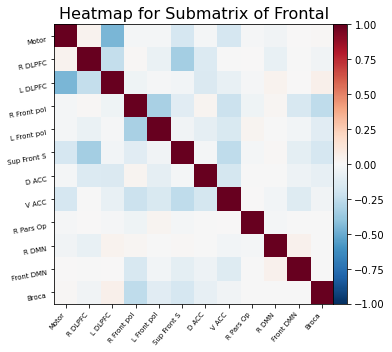

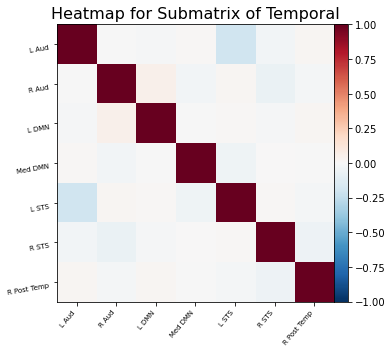

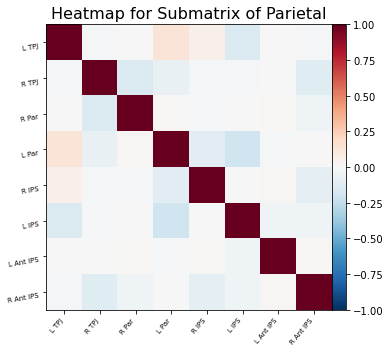

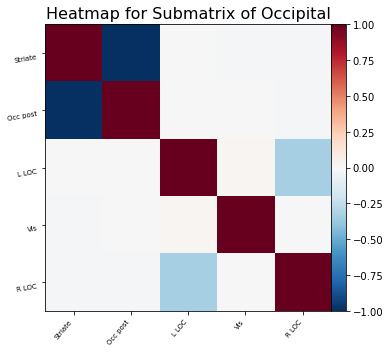

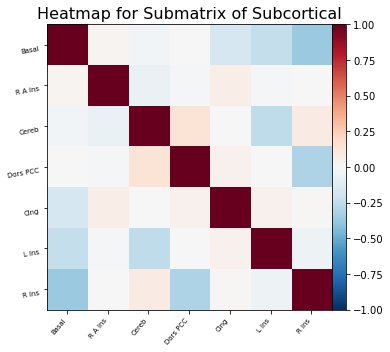

In [62]:
#  new_patient, measured_new_patient_FU

# 006_S_4153, AD, M, 79, v02, V04



from nilearn import datasets, input_data
import os
import numpy as np
import nibabel as nib
from nilearn import datasets, input_data, connectome
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
from nilearn.input_data import NiftiMapsMasker


atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps
atlas_labels = atlas.labels

# atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')


import os
import dicom2nifti
import dicom2nifti.settings as settings
import pydicom

# Define input and output directories

#dicom_folder = "/Users/mariamannone/Downloads/ADNI 5/006_S_4153/Resting_State_fMRI/2011-08-03_08_12_01.0/I248516"

# TEST with the two blocks of V04
dicom_folder = "/Users/mariamannone/Downloads/ADNI 5/006_S_4153/Resting_State_fMRI/2011-11-04_11_36_04.0/I264986"


output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_7/"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
settings.disable_validate_slice_increment()
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)


nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_7/output.nii.gz/"


# Load the MSDL atlas
atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
time_series = []
labels = []

# Iterate over each NIfTI file in the folder
for file_name in os.listdir(nifti_folder):
    if file_name.endswith('.nii.gz'):
        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
        ts = masker.fit_transform(file_path)
        time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
        labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
for i, ts in enumerate(time_series):
    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')



corr_measure = ConnectivityMeasure(kind='correlation')
pcorr_measure = ConnectivityMeasure(kind='partial correlation')

corr_matrices = corr_measure.fit_transform(time_series)
pcorr_matrices = pcorr_measure.fit_transform(time_series)

new_patient = corr_matrices


# FOLLOW-UP


# dicom_folder = "/Users/mariamannone/Downloads/ADNI 5/006_S_4153/Resting_State_fMRI/2011-11-04_11_36_04.0/I264986"

# TEST with the second block of V04
dicom_folder = "/Users/mariamannone/Downloads/ADNI 5/006_S_4153/Resting_State_fMRI/2011-11-04_11_36_04.0/I264987"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_8"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
settings.disable_validate_slice_increment()
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)



nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_8/output.nii.gz/"

# Load the MSDL atlas
atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
time_series = []
labels = []

# Iterate over each NIfTI file in the folder
for file_name in os.listdir(nifti_folder):
    if file_name.endswith('.nii.gz'):
        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
        ts = masker.fit_transform(file_path)
        time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
        labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
for i, ts in enumerate(time_series):
    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')

corr_measure_fu1 = ConnectivityMeasure(kind='correlation')
pcorr_measure_fu1 = ConnectivityMeasure(kind='partial correlation')

corr_matrices_fu1 = corr_measure_fu1.fit_transform(time_series)
pcorr_matrices_fu1 = pcorr_measure_fu1.fit_transform(time_series)


measured_new_patient_FU = corr_matrices_fu1



# Single blocks of the K operator


# Blocks: submatrices corresponding to the lobes

import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}


# Replace these with your actual data
matrix1 = corr_matrices_fu1[0]
matrix2 = corr_matrices[0]

# Compute the inverse of the matrix1
inverse_matrix1 = np.linalg.inv(matrix1)

# Function to visualize submatrix for a given lobe
def visualize_submatrix_for_lobe(lobe):
    lobe_indices = lobe_mapping[lobe]
    submatrix = np.zeros((len(lobe_indices), len(lobe_indices)))
    submatrix_labels = [atlas_labels[i] for i in lobe_indices]  # Get ROI labels

    
    for i, roi1 in enumerate(lobe_indices):
        for j, roi2 in enumerate(lobe_indices):
            submatrix[i, j] = matrix2[roi1, roi2] * inverse_matrix1[roi2, roi1]
    
    # Plot heatmap for the submatrix
    title = f"Heatmap for Submatrix of {lobe}"
    plotting.plot_matrix(submatrix, labels=submatrix_labels, colorbar=True, vmax=1, vmin=-1, title=title)
    plotting.show()

# Visualize submatrices for each lobe
for lobe in lobe_mapping:
    visualize_submatrix_for_lobe(lobe)





In [22]:
# April 19, clear command

del time_series
del connectivity_matrix, correlation_matrix
del connectivity_matrix_fu1, correlation_matrix_fu1, 
del connectivity_matrix_fu1



#del(dicom_folder, output_folder, nifti_file, dicom_files, nifti_file, time_series, correlation_matrix, correlation_matrix_fu1, connectivity_matrix, connectivity_matrix_fu1)


NameError: name 'connectivity_matrix' is not defined

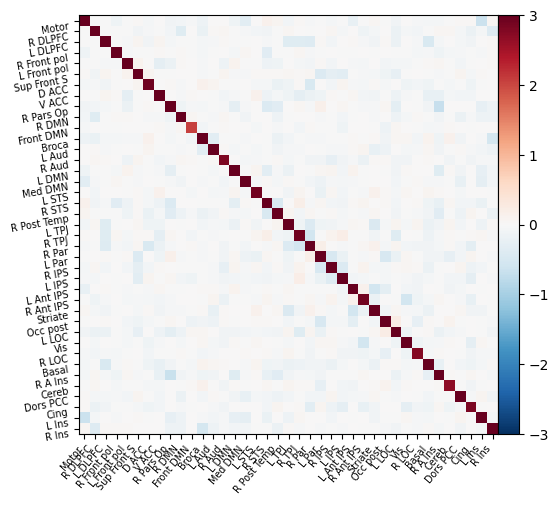

LinAlgError: 1-dimensional array given. Array must be at least two-dimensional

In [65]:
# Attempts of a regression


# Using a regression:

import numpy as np
from sklearn.linear_model import LinearRegression

# Defined before: female_BL, female_FU, male_BL, male_FU, new_patient
# define measured_new_patient_FU, K_measured
# compute estimated_new_patient_FU, K_predicted 

Matrix1 = female_BL[0]
Matrix2 = female_FU[0]
Matrix3 = male_BL[0]
Matrix4 = male_FU[0]

# a new male patient at the baseline: 
Matrix5 = new_patient[0]

# his real 1st FU:
Matrix6 = measured_new_patient_FU[0]

# Calculate K matrices
K_1 = female_FU * np.linalg.inv(female_BL)
K_2 = male_FU * np.linalg.inv(male_BL)




# Prepare your training data
X_train = np.vstack((female_BL.flatten(), male_BL.flatten()))  # Flatten the matrices and stack them vertically
y_train = np.array([K_1.flatten(), K_2.flatten()])  # Flatten the K matrices and convert to array

# Define the linear regression model
model = LinearRegression()

# Train the linear regression model
model.fit(X_train, y_train)

# Predict K_3 for the new patient
estimated_new_patient_FU = new_patient.flatten().reshape(1, 1521)  # TO BE CHANGED! This has to be predicted. # APRIL 30
K_predicted = model.predict(estimated_new_patient_FU).reshape(1, 1521) 

# Reshape back to the original configuration
new_patient = new_patient.reshape(39, 39)
K_predicted = K_predicted.reshape(39, 39)


# Define the reordered list of ROI indices
reordered_indices = [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28, 0, 1, 3, 4, 25, 26, 12, 27, 30, 11, 14, 18, 17, 37, 38, 2, 7, 19, 20, 21, 13, 24, 32, 33, 35, 34, 36]

# Reorder the labels according to the reordered list of indices
reordered_labels = [atlas_labels[i] for i in reordered_indices]

# Print the predicted K_3
title = f"Predicted K-operator for the new patient"
plotting.plot_matrix(K_predicted, labels = reordered_labels, colorbar=True, vmax=3, vmin=-3) # reordered_labels
coords = atlas.region_coords
plt.show()


K_measured = Matrix6 * np.linalg.inv(Matrix5)



# Print the real K_3
title = f"Real K-operator for the new patient"
plotting.plot_matrix(K_measured, labels = reordered_labels, colorbar=True, vmax=1, vmin=-1) # reordered_labels
coords = atlas.region_coords
plt.show()



# check the approximations

tolerance = 10 # e-6
is_close = np.allclose(K_predicted, K_measured, atol=tolerance)

if is_close:
    print("The predicted K-operator IS CLOSE to the real one, with a tolerance of ", tolerance)
else:
    print("The predicted K-operator IS NOT CLOSE to the real one, with a tolerance of ", tolerance)
    
    

Size of the block-diagonal matrix: (39, 39)
Size of the block-diagonal matrix: (39, 39)


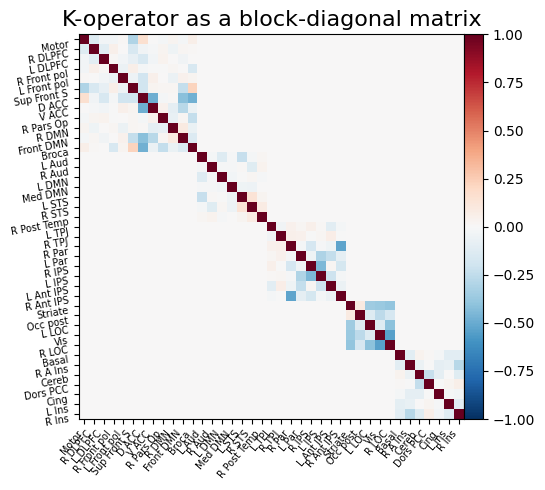

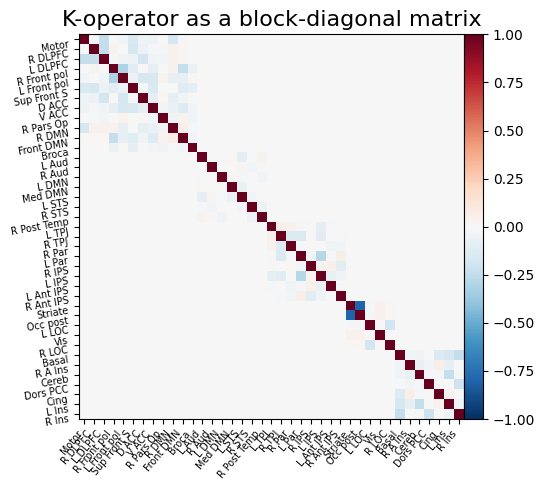

In [66]:
# Directly only the block-diagonal terms of the K-operator

#####


# Block-diagonal representation of K


#####


import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

# Define a custom mapping to group ROIs by brain lobes
lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}



# Function to create block-diagonal matrix from submatrices
def create_block_diagonal_matrix(submatrices, lobe_mapping):
    # Calculate the total number of ROIs
    num_rois = sum(len(roi_list) for roi_list in lobe_mapping.values())
    
    # Initialize the block-diagonal matrix
    block_diagonal_matrix = np.zeros((num_rois, num_rois))
    
    # Fill the block-diagonal matrix with the submatrices
    row_idx = 0
    for lobe, roi_list in lobe_mapping.items():
        size = len(roi_list)
        block_diagonal_matrix[row_idx:row_idx+size, row_idx:row_idx+size] = submatrices[lobe]
        row_idx += size
    
    return block_diagonal_matrix

# Compute the submatrices for each lobe
submatrices = {}
for lobe, roi_list in lobe_mapping.items():
    size = len(roi_list)
    submatrix = np.zeros((size, size))
    for i, roi1 in enumerate(roi_list):
        for j, roi2 in enumerate(roi_list):
            submatrix[i, j] = K_predicted[roi1, roi2]
    submatrices[lobe] = submatrix

# Create the block-diagonal matrix
block_diagonal_K_predicted = create_block_diagonal_matrix(submatrices, lobe_mapping)

# Plot heatmap for the block-diagonal matrix
title = "K-operator as a block-diagonal matrix"
plotting.plot_matrix(block_diagonal_K_predicted, labels=reordered_labels, colorbar=True, vmax=1, vmin=-1, title=title)


print("Size of the block-diagonal matrix:", block_diagonal_K_predicted.shape)

# Compute the submatrices for each lobe
submatrices = {}
for lobe, roi_list in lobe_mapping.items():
    size = len(roi_list)
    submatrix = np.zeros((size, size))
    for i, roi1 in enumerate(roi_list):
        for j, roi2 in enumerate(roi_list):
            submatrix[i, j] = K_measured[roi1, roi2]
    submatrices[lobe] = submatrix

# Create the block-diagonal matrix
block_diagonal_K_measured = create_block_diagonal_matrix(submatrices, lobe_mapping)

# Plot heatmap for the block-diagonal matrix
title = "K-operator as a block-diagonal matrix"
plotting.plot_matrix(block_diagonal_K_measured, labels=reordered_labels, colorbar=True, vmax=1, vmin=-1, title=title)


print("Size of the block-diagonal matrix:", block_diagonal_K_measured.shape)

In [68]:
# Distance between the predicted and measured K


tolerance = 5 # e-6
is_close = np.allclose(K_predicted, K_measured, atol=tolerance)

if is_close:
    print("The predicted K-operator IS CLOSE to the real one, with a tolerance of ", tolerance)
else:
    print("The predicted K-operator IS NOT CLOSE to the real one, with a tolerance of ", tolerance)
    
mat_abs_diff = (K_predicted - K_measured)
# distance_K = np.dot(np.matrix.trace(mat_abs_diff, np.linalg.inv(mat_abs_diff)))
# print(distance_K)

euclidean_distance = np.linalg.norm(mat_abs_diff)
print("Euclidean Distance:", euclidean_distance)

# frobenius_distance = np.linalg.norm(mat_abs_diff)
frobenius_distance = np.linalg.norm(K_predicted - K_measured, ord='fro')
print("Frobenius Distance:", frobenius_distance)
    

The predicted K-operator IS CLOSE to the real one, with a tolerance of  5
Euclidean Distance: 8.265393288810959
Frobenius Distance: 8.265393288810959


In [69]:
del submatrix

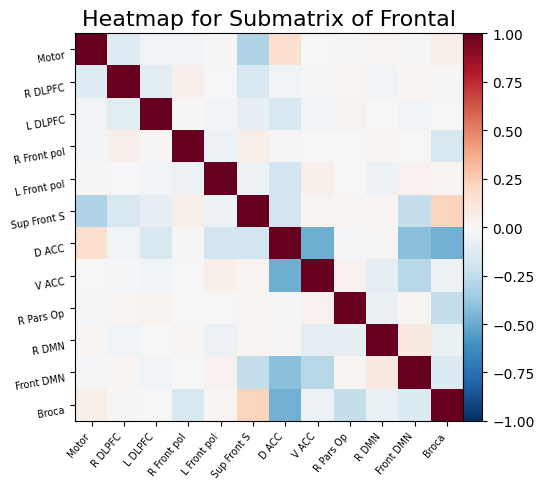

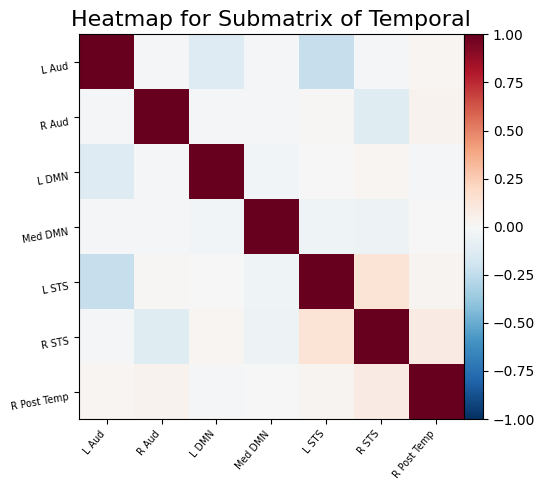

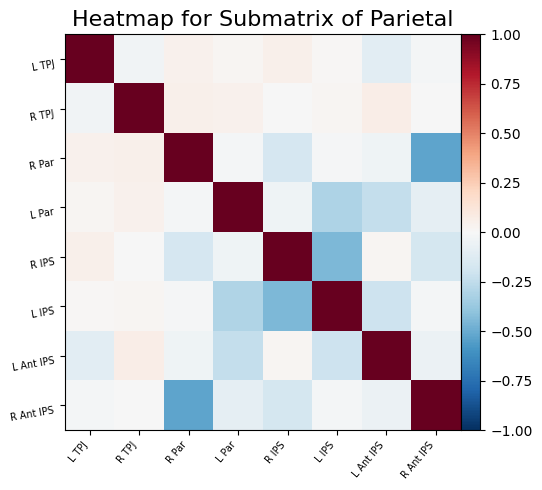

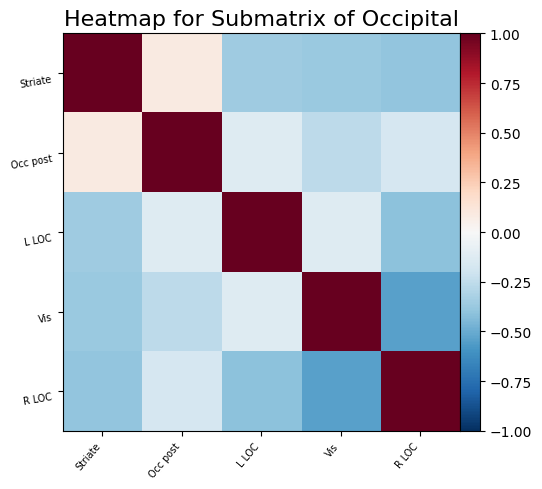

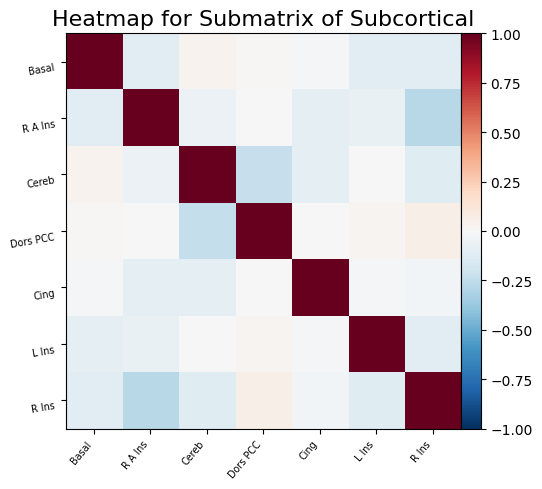

In [71]:
# Single blocks of the predicted K

import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}


# Replace these with your actual data
#matrix1 = corr_matrices_fu1[0]
#matrix2 = corr_matrices[0]

# Compute the inverse of the matrix1
#inverse_matrix1 = np.linalg.inv(matrix1)

# Function to visualize submatrix for a given lobe
def visualize_submatrix_for_lobe(lobe):
    lobe_indices = lobe_mapping[lobe]
    submatrix = np.zeros((len(lobe_indices), len(lobe_indices)))
    submatrix_labels = [atlas_labels[i] for i in lobe_indices]  # Get ROI labels

    
    for i, roi1 in enumerate(lobe_indices):
        for j, roi2 in enumerate(lobe_indices):
            submatrix[i, j] = K_predicted[roi1, roi2] # Here the predicted K
    
    # Plot heatmap for the submatrix
    title = f"Heatmap for Submatrix of {lobe}"
    plotting.plot_matrix(submatrix, labels=submatrix_labels, colorbar=True, vmax=1, vmin=-1, title=title) # -1, 1
    plotting.show()

# Visualize submatrices for each lobe
for lobe in lobe_mapping:
    visualize_submatrix_for_lobe(lobe)





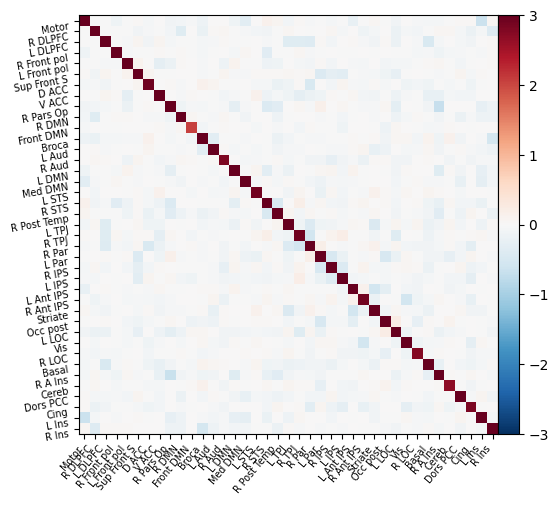

LinAlgError: 1-dimensional array given. Array must be at least two-dimensional

In [72]:
#### May 2

####

# linear regression with a change

# Attempts of a regression


# Using a regression:

import numpy as np
from sklearn.linear_model import LinearRegression

# Defined before: female_BL, female_FU, male_BL, male_FU, new_patient
# define measured_new_patient_FU, K_measured
# compute estimated_new_patient_FU, K_predicted 

Matrix1 = female_BL[0]
Matrix2 = female_FU[0]
Matrix3 = male_BL[0]
Matrix4 = male_FU[0]

# a new male patient at the baseline: 
Matrix5 = new_patient[0]

# his real 1st FU:
Matrix6 = measured_new_patient_FU[0]

# Calculate K matrices
K_1 = female_FU * np.linalg.inv(female_BL)
K_2 = male_FU * np.linalg.inv(male_BL)




# Prepare your training data
X_train = np.vstack((female_BL.flatten(), male_BL.flatten()))  # Flatten the matrices and stack them vertically
y_train = np.array([K_1.flatten(), K_2.flatten()])  # Flatten the K matrices and convert to array

# Define the linear regression model
model = LinearRegression()

# Train the linear regression model
model.fit(X_train, y_train)

# Predict K_3 for the new patient
estimated_new_patient_FU = new_patient.flatten().reshape(1, 1521)  # TO BE CHANGED! This has to be predicted. # APRIL 30
K_predicted = model.predict(estimated_new_patient_FU).reshape(1, 1521) 

# Reshape back to the original configuration
new_patient = new_patient.reshape(39, 39)
K_predicted = K_predicted.reshape(39, 39)


# Define the reordered list of ROI indices
reordered_indices = [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28, 0, 1, 3, 4, 25, 26, 12, 27, 30, 11, 14, 18, 17, 37, 38, 2, 7, 19, 20, 21, 13, 24, 32, 33, 35, 34, 36]

# Reorder the labels according to the reordered list of indices
reordered_labels = [atlas_labels[i] for i in reordered_indices]

# Print the predicted K_3
title = f"Predicted K-operator for the new patient"
plotting.plot_matrix(K_predicted, labels = reordered_labels, colorbar=True, vmax=3, vmin=-3) # reordered_labels
coords = atlas.region_coords
plt.show()


K_measured = Matrix6 * np.linalg.inv(Matrix5)



# Print the real K_3
title = f"Real K-operator for the new patient"
plotting.plot_matrix(K_measured, labels = reordered_labels, colorbar=True, vmax=3, vmin=-3) # reordered_labels
coords = atlas.region_coords
plt.show()



# check the approximations

tolerance = 10 # e-6
is_close = np.allclose(K_predicted, K_measured, atol=tolerance)

if is_close:
    print("The predicted K-operator IS CLOSE to the real one, with a tolerance of ", tolerance)
else:
    print("The predicted K-operator IS NOT CLOSE to the real one, with a tolerance of ", tolerance)
    
    

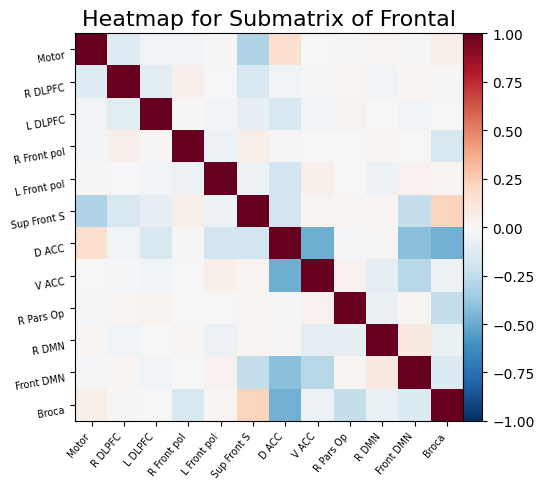

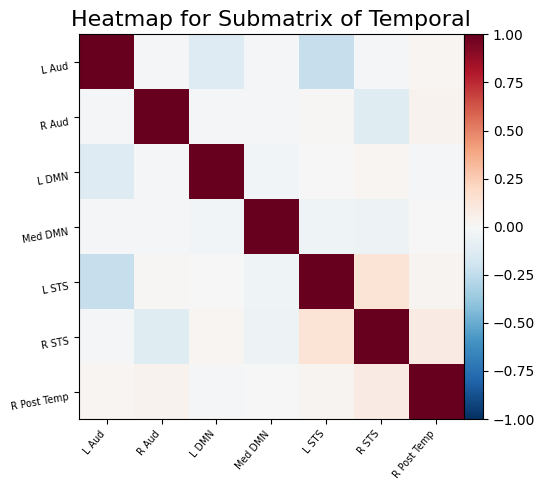

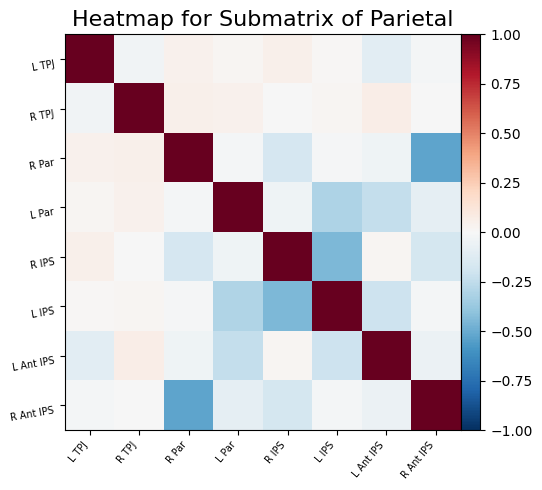

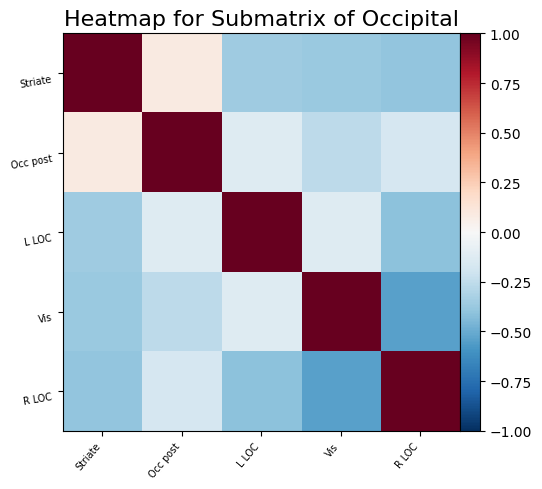

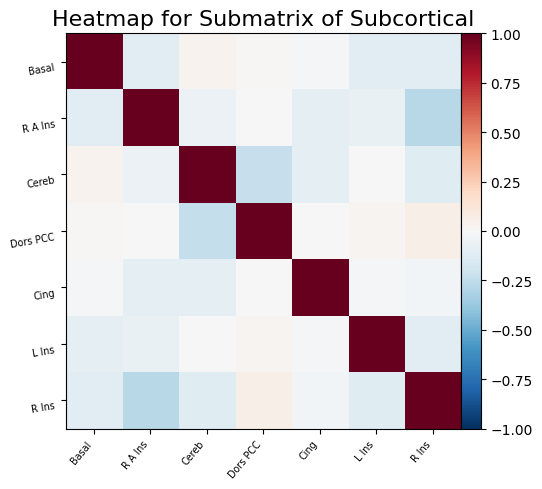

In [74]:
######

# May 2

######

# Blocks of K, when the linear regression is computed with a change


# Single blocks of the predicted K

import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}


# Replace these with your actual data
#matrix1 = corr_matrices_fu1[0]
#matrix2 = corr_matrices[0]

# Compute the inverse of the matrix1
#inverse_matrix1 = np.linalg.inv(matrix1)

# Function to visualize submatrix for a given lobe
def visualize_submatrix_for_lobe(lobe):
    lobe_indices = lobe_mapping[lobe]
    submatrix = np.zeros((len(lobe_indices), len(lobe_indices)))
    submatrix_labels = [atlas_labels[i] for i in lobe_indices]  # Get ROI labels

    
    for i, roi1 in enumerate(lobe_indices):
        for j, roi2 in enumerate(lobe_indices):
            submatrix[i, j] = K_predicted[roi1, roi2] # Here the predicted K
    
    # Plot heatmap for the submatrix
    title = f"Heatmap for Submatrix of {lobe}"
    plotting.plot_matrix(submatrix, labels=submatrix_labels, colorbar=True, vmax=1, vmin=-1, title=title) # -1, 1
    plotting.show()

# Visualize submatrices for each lobe
for lobe in lobe_mapping:
    visualize_submatrix_for_lobe(lobe)





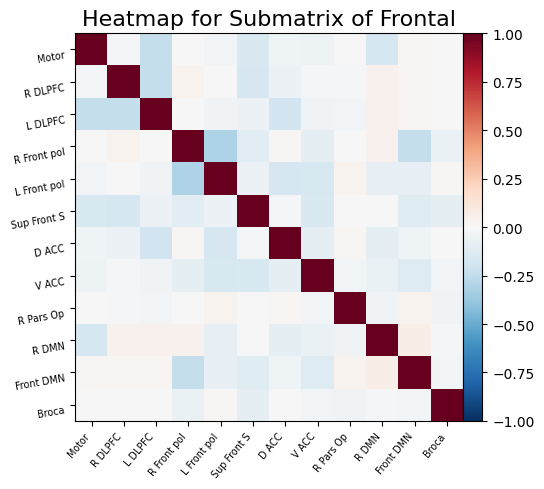

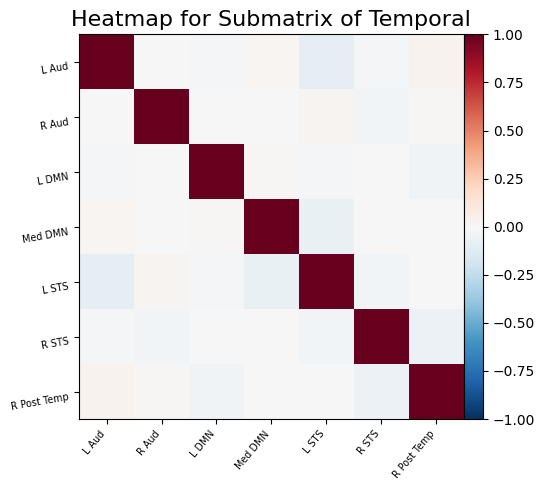

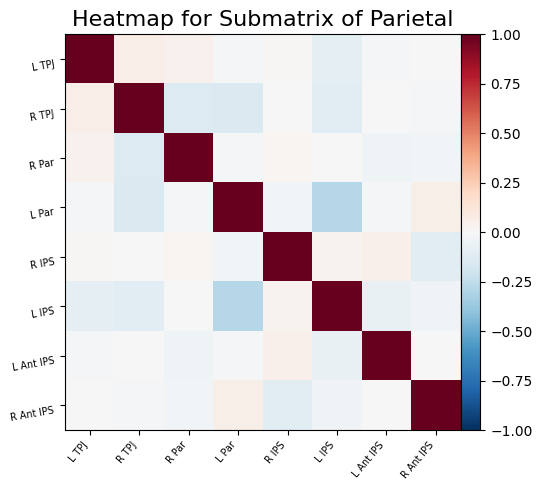

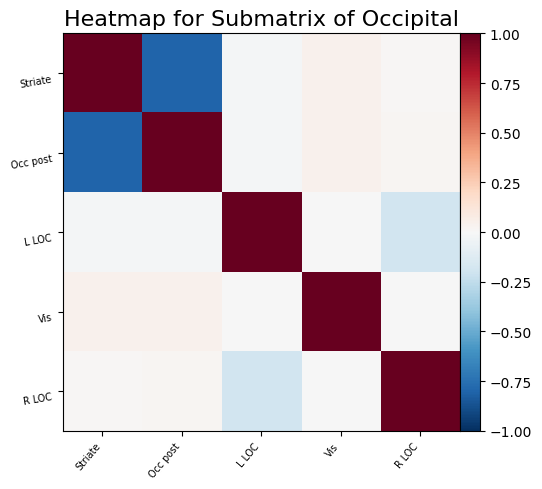

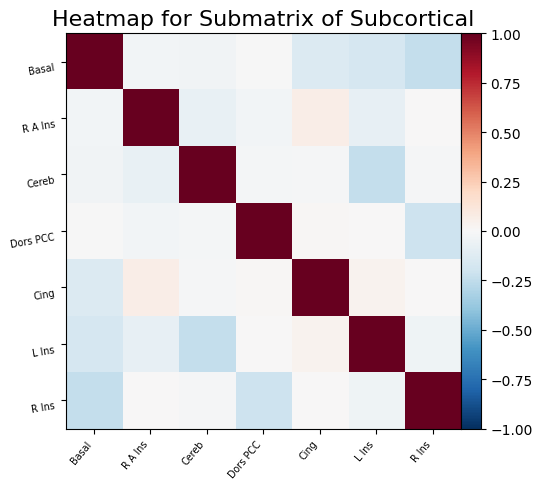

In [76]:
# Single blocks of the measured K

import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}


# Replace these with your actual data
#matrix1 = corr_matrices_fu1[0]
#matrix2 = corr_matrices[0]

# Compute the inverse of the matrix1
#inverse_matrix1 = np.linalg.inv(matrix1)

# Function to visualize submatrix for a given lobe
def visualize_submatrix_for_lobe(lobe):
    lobe_indices = lobe_mapping[lobe]
    submatrix = np.zeros((len(lobe_indices), len(lobe_indices)))
    submatrix_labels = [atlas_labels[i] for i in lobe_indices]  # Get ROI labels

    
    for i, roi1 in enumerate(lobe_indices):
        for j, roi2 in enumerate(lobe_indices):
            submatrix[i, j] = K_measured[roi1, roi2] # Here the predicted K
    
    # Plot heatmap for the submatrix
    title = f"Heatmap for Submatrix of {lobe}"
    plotting.plot_matrix(submatrix, labels=submatrix_labels, colorbar=True, vmax=1, vmin=-1, title=title) # -1, 1
    plotting.show()

# Visualize submatrices for each lobe
for lobe in lobe_mapping:
    visualize_submatrix_for_lobe(lobe)





In [57]:
#

# April 16
# Little change of medical atlas to highlight the information on ventricles,
# hippocampus, entherinal:

#

from nilearn import datasets

# Load the AAL atlas
aal = datasets.fetch_atlas_aal()

# Access the labels and coordinates
atlas_labels = aal['labels']
atlas_coords = aal['maps']

# Print the labels and corresponding indices
for i, label in enumerate(atlas_labels):
    if 'ventricle' in label.lower() or 'hippo' in label.lower() or 'entorhinal' in label.lower():
        print(f"Index {i}: {label}")

        
# ROI concerning hyppocampus in the AAL atlas:
# 37, 38, 39, 40

Index 36: Hippocampus_L
Index 37: Hippocampus_R
Index 38: ParaHippocampal_L
Index 39: ParaHippocampal_R


In [ ]:


# some preliminary comments, on highlighted pixels and MEMORY

# Frontal, 1-8
# Left Auditory Cortex - Occipital Posterior
# reference: "Posterior Cortical Atrophy"
# https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3740271/
# "Performance on cognitive tasks with any significant visual component
# (e.g. visual memory recall, Trail Making, Stroop test) are vulnerable to
# impairment and misinterpretation, and thus accurate assessment requires the selection
# of tasks which minimise visual demands (e.g. auditory-verbal memory tasks,
# naming from verbal description)."
 

# Temporal, 1-2 diminised connectivity:
# visual cortex -  Right Lateral Occipital Cortex
# reference: "The lateral occipital complex and its role in object recognition",
# https://pubmed.ncbi.nlm.nih.gov/11322983/

# Temporal 3-7: Dorsal Anterior Cingulate Cortex - Right Superior Temporal Sulcus
# CHANGE PAPER
# reference: "The cingulate cortex",
# https://academic.oup.com/book/46855/chapter/413761846

# Occipital 1-3,
# Right Temporoparietal Junction - Cerebellum
# CHANGE PAPER
# reference: "Cerebellum in Alzheimer’s disease and frontotemporal dementia: not a silent bystander"
# https://academic.oup.com/brain/article/139/5/1314/2468770


In [ ]:
# Notes from CHAT GPT, concernings ROIs and memory:

# Medial Temporal Lobe (MTL):

# Hippocampus: Plays a crucial role in the formation of new memories, particularly episodic and spatial
# memories.
# Entorhinal Cortex: Acts as a gateway between the neocortex and the hippocampus, facilitating memory
# encoding and retrieval.
# Prefrontal Cortex (PFC):

# Dorsolateral Prefrontal Cortex (DLPFC): Involved in working memory, executive functions, and strategic
# aspects of memory retrieval.
# Ventromedial Prefrontal Cortex (VMPFC): Plays a role in emotional memory, decision-making, and social
# cognition.
# Posterior Parietal Cortex:

# Precuneus: Associated with episodic memory retrieval, self-referential processing, and spatial memory.
# Posterior Cingulate Cortex (PCC): Connected to the hippocampus and involved in episodic memory retrieval
# and self-referential processing.
# Thalamus: Acts as a relay station between different brain regions and is involved in memory formation
# and retrieval.

# Amygdala: Plays a role in emotional memory formation and modulation of memory consolidation.

# Basal Ganglia: Involved in procedural memory, habit formation, and motor learning.

# Cerebellum: Associated with motor learning, procedural memory, and certain aspects of cognitive function.

# Temporal Cortex: Various regions within the temporal cortex, including the perirhinal cortex
# and parahippocampal cortex, contribute to different aspects of memory, such as object recognition,
# semantic memory, and contextual memory.

# These brain areas are interconnected and form complex networks that support the encoding, consolidation,
# storage, and retrieval of memories. Dysfunction or damage to any of these regions or their connections
# can lead to memory impairments.


In [ ]:
###

# Time series baseline

###


# from fMRI to time series


import pydicom
import numpy as np
from scipy.signal import hilbert

# Load DICOM files

# Directory containing DICOM files
dicom_folder = "/Users/mariamannone/Downloads/ADNI/012_S_4545/Resting_State_fMRI/2012-06-25_12_12_18.0/I312870"

# Load DICOM files
dicom_files = [pydicom.dcmread(os.path.join(dicom_folder, file)) for file in sorted(os.listdir(dicom_folder))]

# Extract fMRI data
fMRI_data = np.stack([d.pixel_array for d in dicom_files], axis=-1)

# Preprocess the data if needed (e.g., motion correction, slice timing correction)

# Extract time series
time_series = np.mean(fMRI_data, axis=(0, 1))  # Assuming a 2D time series

# Apply the Hilbert transform
analytic_signal = hilbert(time_series)

# Analyze the transformed data (e.g., extract amplitude envelope, instantaneous phase)
amplitude_envelope = np.abs(analytic_signal)
instantaneous_phase = np.angle(analytic_signal)
instantaneous_frequency = np.diff(np.unwrap(instantaneous_phase))  # Compute instantaneous frequency


import numpy as np
import matplotlib.pyplot as plt

# Assuming you have a time array and an analytic_signal array
time = np.arange(len(analytic_signal))  # Generate a time array

# Plot the real part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, amplitude_envelope, color='blue')
plt.title('Amplitude envelope')
plt.grid(True)
plt.show()

# Plot the real part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, np.real(analytic_signal), color='blue')
plt.xlabel('Time')
plt.ylabel('Real Part')
plt.title('Real Part of Analytic Signal over Time')
plt.grid(True)
plt.show()

# Plot the imaginary part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, np.imag(analytic_signal), color='red')
plt.xlabel('Time')
plt.ylabel('Imaginary Part')
plt.title('Imaginary Part of Analytic Signal over Time')
plt.grid(True)
plt.show()

import numpy as np
import matplotlib.pyplot as plt


In [ ]:


# time series follow-up


# from fMRI to time series


import pydicom
import numpy as np
from scipy.signal import hilbert

# Load DICOM files

# Directory containing DICOM files
dicom_folder = "/Users/mariamannone/Downloads/ADNI/012_S_4545/Resting_State_fMRI/2012-09-24_12_16_09.0/I336708"

# Load DICOM files
dicom_files = [pydicom.dcmread(os.path.join(dicom_folder, file)) for file in sorted(os.listdir(dicom_folder))]

# Extract fMRI data
fMRI_data_fu1 = np.stack([d.pixel_array for d in dicom_files], axis=-1)

# Preprocess the data if needed (e.g., motion correction, slice timing correction)

# Extract time series
time_series_fu1 = np.mean(fMRI_data_fu1, axis=(0, 1))  # Assuming a 2D time series

# Apply the Hilbert transform
analytic_signal_fu1 = hilbert(time_series_fu1)

# Analyze the transformed data (e.g., extract amplitude envelope, instantaneous phase)
amplitude_envelope_fu1 = np.abs(analytic_signal_fu1)
instantaneous_phase_fu1 = np.angle(analytic_signal_fu1)
instantaneous_frequency_fu1 = np.diff(np.unwrap(instantaneous_phase_fu1))  # Compute instantaneous frequency


import numpy as np
import matplotlib.pyplot as plt

# Assuming you have a time array and an analytic_signal array
time = np.arange(len(analytic_signal_fu1))  # Generate a time array

# Plot the real part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, amplitude_envelope, color='blue')
plt.title('Amplitude envelope')
plt.grid(True)
plt.show()

# Plot the real part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, np.real(analytic_signal_fu1), color='blue')
plt.xlabel('Time')
plt.ylabel('Real Part')
plt.title('Real Part of Analytic Signal over Time')
plt.grid(True)
plt.show()

# Plot the imaginary part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, np.imag(analytic_signal_fu1), color='red')
plt.xlabel('Time')
plt.ylabel('Imaginary Part')
plt.title('Imaginary Part of Analytic Signal over Time')
plt.grid(True)
plt.show()


In [ ]:
###

# Fourier Transforms of the real part of the analytic signal

###

# baseline

import numpy as np
import matplotlib.pyplot as plt

t = np.linspace(0, 1, 10) 

# Generate or load your time series data
# time_series = np.mean(fMRI_data, axis=(0, 1))  # Example: random time series data

# Compute the Fourier transform
# fourier_transform = np.fft.fft(time_series)
fourier_transform = np.fft.fft(np.real(analytic_signal))

# Compute the frequencies associated with the Fourier transform
sampling_rate = 0.01  # Define the sampling rate (e.g., in Hz)
# frequencies = np.fft.fftfreq(len(time_series), d=1/sampling_rate)
frequencies = np.fft.fftfreq(len(time_series), t[1] - t[0])  # Compute frequencies

# Plot the magnitude spectrum (absolute values of the Fourier transform)
plt.figure(figsize=(10, 5))
plt.plot(frequencies, np.abs(fourier_transform))
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Fourier Transform')
plt.grid(True)
plt.show()


In [ ]:
### Fourier Transform of the 1sr follow-up


# Generate or load your time series data
#time_series = np.mean(fMRI_data_fu1, axis=(0, 1))  # Example: random time series data

t = np.linspace(0, 1, 60) 

# Compute the Fourier transform
#fourier_transform = np.fft.fft(time_series)
fourier_transform = np.fft.fft(np.real(analytic_signal_fu1))

# Compute the frequencies associated with the Fourier transform
sampling_rate = 1  # Define the sampling rate (e.g., in Hz)
# frequencies = np.fft.fftfreq(len(time_series), d=1/sampling_rate)
frequencies = np.fft.fftfreq(len(time_series), t[1] - t[0])  # Compute frequencies

# Plot the magnitude spectrum (absolute values of the Fourier transform)
plt.figure(figsize=(10, 5))
plt.plot(frequencies, np.abs(fourier_transform))
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Fourier Transform')
plt.grid(True)
plt.show()


In [ ]:


# Input: I will use later the time series from the fMRI
# Quantum circuit to analyze their phase different
# Output: a classifier of the "degree of disease" for a specific region


from qiskit import QuantumCircuit, Aer, execute
from qiskit.visualization import plot_histogram

# Define your time series data
time_series_1 = [0.2, 0.5, 0.8, 0.3]  # Example time series data
time_series_2 = [0.4, 0.6, 0.9, 0.2]  # Example time series data

# Create a quantum circuit
qc = QuantumCircuit(4, 3)  # 4 qubits for encoding time series, 3 ancilla qubits

# Encode time series onto the quantum register
for i, val in enumerate(time_series_1):
    qc.ry(val, i)

# Apply unitary operator (e.g., phase shift gate) to the quantum register
# This is a placeholder - replace it with your desired unitary operation

# Implement Quantum Phase Estimation
# This involves applying controlled versions of the unitary operator
# and performing inverse quantum Fourier transform

# Measure the ancilla qubits
qc.measure([0, 1, 2], [0, 1, 2])

# Simulate the quantum circuit
backend = Aer.get_backend('qasm_simulator')
job = execute(qc, backend)
result = job.result()
counts = result.get_counts()

# Visualize the measurement results
plot_histogram(counts)


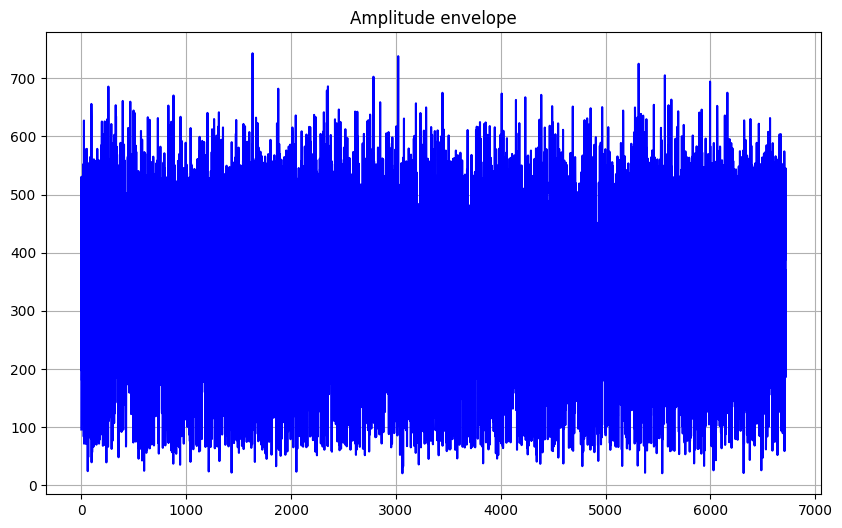

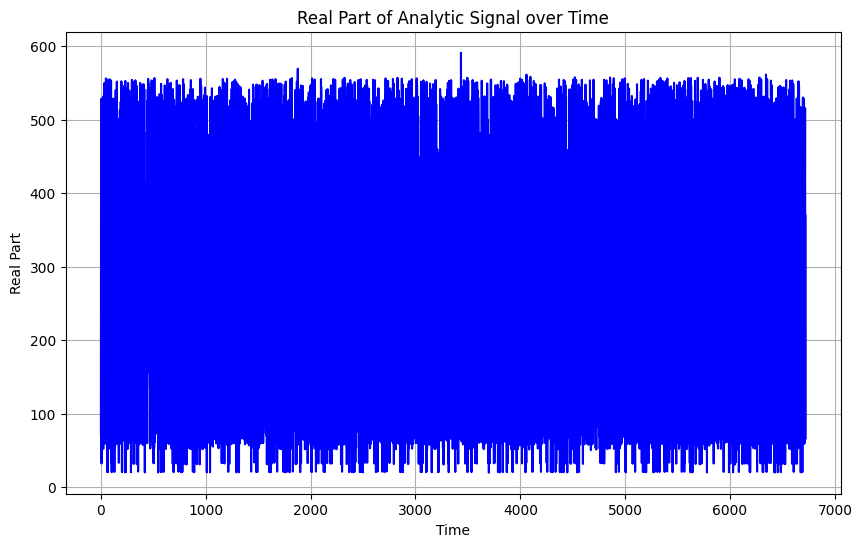

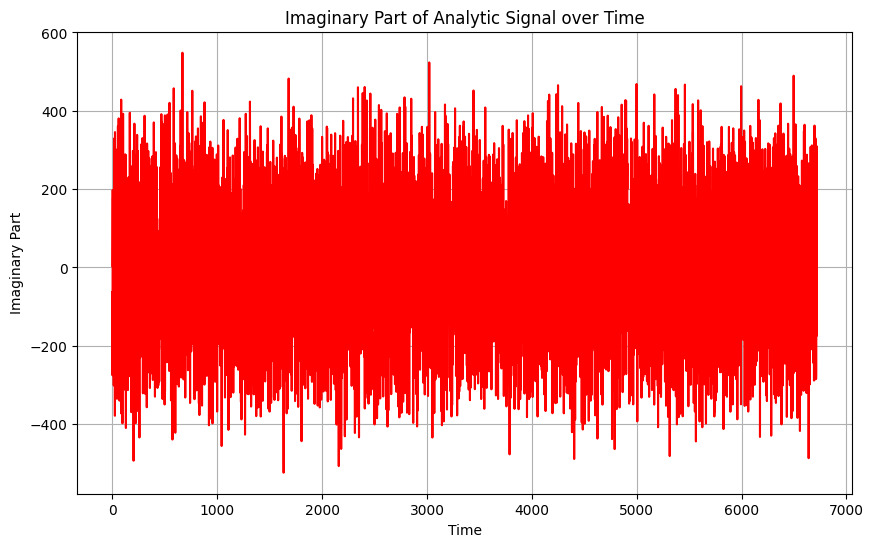

/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/base_masker.py:253: UserWarning: memory_level is currently set to 0 but a Memory object has been provided. Setting memory_level to 1.
  return self.transform_single_imgs(


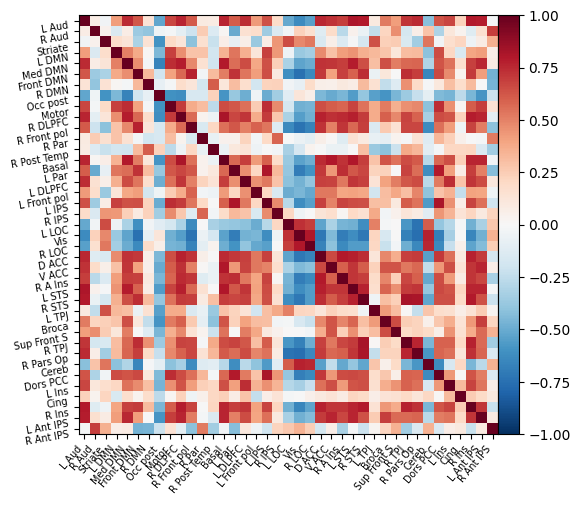

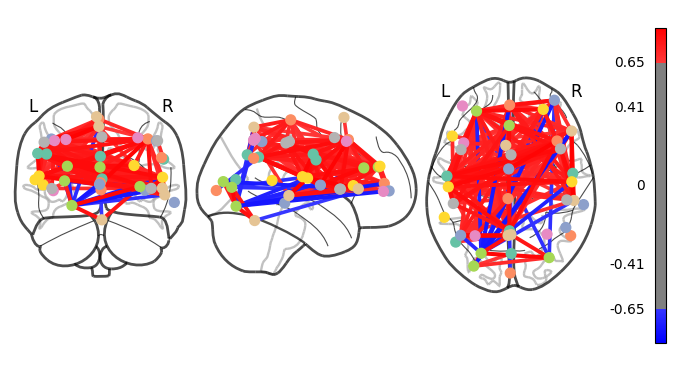

In [30]:
# ANOTHER PATIENT, 002_S_5018, male, 73 y.o., v02, v04, v05, v11


###

# Time series baseline

###


# from fMRI to time series


import pydicom
import numpy as np
from scipy.signal import hilbert

# Load DICOM files

# Directory containing DICOM files
dicom_folder = "/Users/mariamannone/Downloads/ADNI 2/002_S_5018/Resting_State_fMRI/2012-11-08_07_20_35.0/I346237"

# Load DICOM files
dicom_files = [pydicom.dcmread(os.path.join(dicom_folder, file)) for file in sorted(os.listdir(dicom_folder))]

# Extract fMRI data
fMRI_data = np.stack([d.pixel_array for d in dicom_files], axis=-1)

# Preprocess the data if needed (e.g., motion correction, slice timing correction)

# Extract time series
time_series = np.mean(fMRI_data, axis=(0, 1))  # Assuming a 2D time series

# Apply the Hilbert transform
analytic_signal = hilbert(time_series)

# Analyze the transformed data (e.g., extract amplitude envelope, instantaneous phase)
amplitude_envelope = np.abs(analytic_signal)
instantaneous_phase = np.angle(analytic_signal)
instantaneous_frequency = np.diff(np.unwrap(instantaneous_phase))  # Compute instantaneous frequency


import numpy as np
import matplotlib.pyplot as plt

# Assuming you have a time array and an analytic_signal array
time = np.arange(len(analytic_signal))  # Generate a time array

# Plot the real part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, amplitude_envelope, color='blue')
plt.title('Amplitude envelope')
plt.grid(True)
plt.show()

# Plot the real part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, np.real(analytic_signal), color='blue')
plt.xlabel('Time')
plt.ylabel('Real Part')
plt.title('Real Part of Analytic Signal over Time')
plt.grid(True)
plt.show()

# Plot the imaginary part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, np.imag(analytic_signal), color='red')
plt.xlabel('Time')
plt.ylabel('Imaginary Part')
plt.title('Imaginary Part of Analytic Signal over Time')
plt.grid(True)
plt.show()

import numpy as np
import matplotlib.pyplot as plt



from nilearn import datasets, input_data
import os
import numpy as np
import nibabel as nib
from nilearn import datasets, input_data, connectome
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np


atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps
atlas_labels = atlas.labels

# atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')


import os
import dicom2nifti
import dicom2nifti.settings as settings
import pydicom

# Define input and output directories
dicom_folder = "/Users/mariamannone/Downloads/ADNI/012_S_4545/Resting_State_fMRI/2012-06-25_12_12_18.0/I312870"
output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_April/"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
settings.disable_validate_slice_increment()
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)

from nilearn.input_data import NiftiMapsMasker


nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_April/output.nii.gz/"

# Load the MSDL atlas
atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
time_series = []
labels = []

# Iterate over each NIfTI file in the folder
for file_name in os.listdir(nifti_folder):
    if file_name.endswith('.nii.gz'):
        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
        ts = masker.fit_transform(file_path)
        time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
        labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
for i, ts in enumerate(time_series):
    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')


corr_measure = ConnectivityMeasure(kind='correlation')
pcorr_measure = ConnectivityMeasure(kind='partial correlation')

corr_matrices = corr_measure.fit_transform(time_series)
pcorr_matrices = pcorr_measure.fit_transform(time_series)



# Partial correlation matrix
plotting.plot_matrix(corr_matrices[0], labels=atlas_labels, colorbar=True, vmax=1, vmin=-1)

# Connectome over brain schematic
coords = atlas.region_coords # Get center coordinates of each ROI
plotting.plot_connectome(corr_matrices[0], coords, edge_threshold="80%", colorbar=True)





In [ ]:
import numpy as np

# Example atlas data (replace this with your actual data)
atlas_data = np.random.rand(10, 10, 10, 100)  # Example: 4D array representing atlas data



# CORRECT THE NAMES!!!


# Example memory-related ROI names
memory_ROI_names = ['Left Parahippocampal Gyrus', 'Right Parahippocampal Gyrus', 'Left Hippocampus', 'Right Hippocampus']

# Dictionary mapping ROI names to indices (replace this with actual indices if available)
roi_indices_mapping = {'Left Parahippocampal Gyrus': 35, 'Right Parahippocampal Gyrus': 36, 'Left Hippocampus': 37, 'Right Hippocampus': 38}

# Extract time series for memory-related ROIs
memory_ROI_indices = [roi_indices_mapping[name] for name in memory_ROI_names]
memory_ROI_time_series = atlas_data[:, :, :, memory_ROI_indices]

# Print the shape of the extracted time series
print("Shape of memory ROI time series:", memory_ROI_time_series.shape)

# Print time series for memory-related ROIs
#for idx, roi_idx in enumerate(memory_ROI_indices):
#    print(f"Time series for ROI '{atlas_labels[roi_idx]}':")
#    print(memory_ROI_time_series[..., idx])
#    print("-" * 50)
    
import matplotlib.pyplot as plt

# Visualize time series for memory-related ROIs
for idx, roi_idx in enumerate(memory_ROI_indices):
    roi_name = atlas_labels[roi_idx]
    time_series = memory_ROI_time_series[:, idx, 0]  # Selecting the first component if there are more than one
    plt.figure(figsize=(10, 4))
    plt.plot(time_series)
    plt.title(f"Time series for ROI '{roi_name}'")
    plt.xlabel("Time")
    plt.ylabel("Signal Intensity")
    plt.grid(True)
    plt.show()

In [ ]:
####

# Same patient 3rd of the follow-up, because this is working



# from fMRI to time series


import pydicom
import numpy as np
from scipy.signal import hilbert

# Load DICOM files

# Directory containing DICOM files
dicom_folder = "/Users/mariamannone/Downloads/ADNI 2/002_S_5018/Resting_State_fMRI/2013-05-16_12_20_33.0/I372812"

# Load DICOM files
dicom_files = [pydicom.dcmread(os.path.join(dicom_folder, file)) for file in sorted(os.listdir(dicom_folder))]

# Extract fMRI data
fMRI_data_fu1 = np.stack([d.pixel_array for d in dicom_files], axis=-1)

# Preprocess the data if needed (e.g., motion correction, slice timing correction)

# Extract time series
time_series_fu1 = np.mean(fMRI_data_fu1, axis=(0, 1))  # Assuming a 2D time series

# Apply the Hilbert transform
analytic_signal_fu1 = hilbert(time_series_fu1)

# Analyze the transformed data (e.g., extract amplitude envelope, instantaneous phase)
amplitude_envelope_fu1 = np.abs(analytic_signal_fu1)
instantaneous_phase_fu1 = np.angle(analytic_signal_fu1)
instantaneous_frequency_fu1 = np.diff(np.unwrap(instantaneous_phase_fu1))  # Compute instantaneous frequency


import numpy as np
import matplotlib.pyplot as plt

# Assuming you have a time array and an analytic_signal array
time = np.arange(len(analytic_signal_fu1))  # Generate a time array

# Plot the real part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, amplitude_envelope, color='blue')
plt.title('Amplitude envelope')
plt.grid(True)
plt.show()

# Plot the real part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, np.real(analytic_signal_fu1), color='blue')
plt.xlabel('Time')
plt.ylabel('Real Part')
plt.title('Real Part of Analytic Signal over Time')
plt.grid(True)
plt.show()

# Plot the imaginary part of the analytic signal against time
plt.figure(figsize=(10, 6))
plt.plot(time, np.imag(analytic_signal_fu1), color='red')
plt.xlabel('Time')
plt.ylabel('Imaginary Part')
plt.title('Imaginary Part of Analytic Signal over Time')
plt.grid(True)
plt.show()




from nilearn import datasets, input_data
import os
import numpy as np
import nibabel as nib
from nilearn import datasets, input_data, connectome
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np


atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps
atlas_labels = atlas.labels

# atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')


import os
import dicom2nifti
import dicom2nifti.settings as settings
import pydicom

# Define input and output directories
dicom_folder = "/Users/mariamannone/Downloads/ADNI 2/002_S_5018/Resting_State_fMRI/2013-05-16_12_20_33.0/I372812"
output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_April_fu/"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
settings.disable_validate_slice_increment()
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)

from nilearn.input_data import NiftiMapsMasker


nifti_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_converted_ADNI_April_fu/output.nii.gz/"

# Load the MSDL atlas
atlas = datasets.fetch_atlas_msdl()
atlas_filename = atlas.maps

# Create a masker using NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True, memory='nilearn_cache')

# Initialize lists to store time series and labels
time_series = []
labels = []

# Iterate over each NIfTI file in the folder
for file_name in os.listdir(nifti_folder):
    if file_name.endswith('.nii.gz'):
        file_path = os.path.join(nifti_folder, file_name)

        # Load and standardize time series using the masker
        ts = masker.fit_transform(file_path)
        time_series.append(ts)

        # Extract the label from the file name or metadata
        # You may need to adapt this based on your file naming or metadata conventions
        labels.append(file_name.split('_')[1])  # Example: Assumes file_name is like 'subject_label.nii.gz'

# Save time series
for i, ts in enumerate(time_series):
    np.savetxt(f'time_series_{i:04d}.csv', ts, delimiter=',')


corr_measure_fu = ConnectivityMeasure(kind='correlation')
pcorr_measure_fu = ConnectivityMeasure(kind='partial correlation')

corr_matrices_fu = corr_measure.fit_transform(time_series)
pcorr_matrices_fu = pcorr_measure.fit_transform(time_series)



# Partial correlation matrix
plotting.plot_matrix(corr_matrices_fu[0], labels=atlas_labels, colorbar=True, vmax=1, vmin=-1)

# Connectome over brain schematic
coords = atlas.region_coords # Get center coordinates of each ROI
plotting.plot_connectome(corr_matrices_fu[0], coords, edge_threshold="80%", colorbar=True)




In [ ]:
# Compute the K operator between these and the other follow-ups.

# All the files for this patient:

# 002_S_5018, male, 73 y.o., v02, v04, v05, v11

# /Users/mariamannone/Downloads/ADNI 2/002_S_5018/Resting_State_fMRI/2012-11-08_07_20_35.0/I346237
# /Users/mariamannone/Downloads/ADNI 2/002_S_5018/Resting_State_fMRI/2013-02-11_07_46_12.0/I358614
# /Users/mariamannone/Downloads/ADNI 2/002_S_5018/Resting_State_fMRI/2013-05-16_12_20_33.0/I372812
# /Users/mariamannone/Downloads/ADNI 2/002_S_5018/Resting_State_fMRI/2013-11-18_10_41_00.0/I398684

In [ ]:
# Directly only the block-diagonal terms of the K-operator

#####


# Block-diagonal representation of K


#####


import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

# Define a custom mapping to group ROIs by brain lobes
lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}

# Load matrices computed for the control and AP patients
# Replace these with your actual data
matrix1 = corr_matrices_fu[0]
matrix2 = corr_matrices[0]

# Function to create block-diagonal matrix from submatrices
def create_block_diagonal_matrix(submatrices, lobe_mapping):
    # Calculate the total number of ROIs
    num_rois = sum(len(roi_list) for roi_list in lobe_mapping.values())
    
    # Initialize the block-diagonal matrix
    block_diagonal_matrix = np.zeros((num_rois, num_rois))
    
    # Fill the block-diagonal matrix with the submatrices
    row_idx = 0
    for lobe, roi_list in lobe_mapping.items():
        size = len(roi_list)
        block_diagonal_matrix[row_idx:row_idx+size, row_idx:row_idx+size] = submatrices[lobe]
        row_idx += size
    
    return block_diagonal_matrix

# Compute the inverse of the matrix1
inverse_matrix1 = np.linalg.inv(matrix1)

# Compute the submatrices for each lobe
submatrices = {}
for lobe, roi_list in lobe_mapping.items():
    size = len(roi_list)
    submatrix = np.zeros((size, size))
    for i, roi1 in enumerate(roi_list):
        for j, roi2 in enumerate(roi_list):
            submatrix[i, j] = matrix2[roi1, roi2] * inverse_matrix1[roi2, roi1]
    submatrices[lobe] = submatrix

# Create the block-diagonal matrix
block_diagonal_matrix = create_block_diagonal_matrix(submatrices, lobe_mapping)

# Plot heatmap for the block-diagonal matrix
title = "K-operator as a block-diagonal matrix"
plotting.plot_matrix(block_diagonal_matrix, labels=reordered_labels, colorbar=True, vmax=1, vmin=-1, title=title)


print("Size of the block-diagonal matrix:", block_diagonal_matrix.shape)

In [ ]:
# Single diagonal blocks:

# Single blocks of the K operator


# Blocks: submatrices corresponding to the lobes

import numpy as np
from nilearn import plotting, datasets

# Load the MSDL atlas for labels and coordinates
atlas = datasets.fetch_atlas_msdl()
atlas_labels = atlas.labels
coords = atlas.region_coords

# Define a custom mapping to group ROIs by brain lobes
lobe_mapping = {
    'Frontal': [8, 9, 15, 10, 16, 29, 22, 23, 31, 6, 5, 28],
    'Temporal': [0, 1, 3, 4, 25, 26, 12],
    'Parietal': [27, 30, 11, 14, 18, 17, 37, 38],
    'Occipital': [2, 7, 19, 20, 21],
    'Subcortical': [13, 24, 32, 33, 35, 34, 36]
}


# Replace these with your actual data
matrix1 = corr_matrices_fu[0]
matrix2 = corr_matrices[0]

# Compute the inverse of the matrix1
inverse_matrix1 = np.linalg.inv(matrix1)

# Function to visualize submatrix for a given lobe
def visualize_submatrix_for_lobe(lobe):
    lobe_indices = lobe_mapping[lobe]
    submatrix = np.zeros((len(lobe_indices), len(lobe_indices)))
    submatrix_labels = [atlas_labels[i] for i in lobe_indices]  # Get ROI labels

    
    for i, roi1 in enumerate(lobe_indices):
        for j, roi2 in enumerate(lobe_indices):
            submatrix[i, j] = matrix2[roi1, roi2] * inverse_matrix1[roi2, roi1]
    
    # Plot heatmap for the submatrix
    title = f"Heatmap for Submatrix of {lobe}"
    plotting.plot_matrix(submatrix, labels=submatrix_labels, colorbar=True, vmax=1, vmin=-1, title=title)
    plotting.show()

# Visualize submatrices for each lobe
for lobe in lobe_mapping:
    visualize_submatrix_for_lobe(lobe)




In [ ]:
import numpy as np

# Example atlas data (replace this with your actual data)
atlas_data = np.random.rand(10, 10, 10, 100)  # Example: 4D array representing atlas data

# Example memory-related ROI names

# CORRECT THE NAMES!!!
memory_ROI_names = ['Left Parahippocampal Gyrus', 'Right Parahippocampal Gyrus', 'Left Hippocampus', 'Right Hippocampus']

# Dictionary mapping ROI names to indices (replace this with actual indices if available)
roi_indices_mapping = {'Left Parahippocampal Gyrus': 35, 'Right Parahippocampal Gyrus': 36, 'Left Hippocampus': 37, 'Right Hippocampus': 38}

# Extract time series for memory-related ROIs
memory_ROI_indices = [roi_indices_mapping[name] for name in memory_ROI_names]
memory_ROI_time_series = atlas_data[:, :, :, memory_ROI_indices]

# Print the shape of the extracted time series
print("Shape of memory ROI time series:", memory_ROI_time_series.shape)

# Print time series for memory-related ROIs
#for idx, roi_idx in enumerate(memory_ROI_indices):
#    print(f"Time series for ROI '{atlas_labels[roi_idx]}':")
#    print(memory_ROI_time_series[..., idx])
#    print("-" * 50)
    
import matplotlib.pyplot as plt

# Visualize time series for memory-related ROIs
for idx, roi_idx in enumerate(memory_ROI_indices):
    roi_name = atlas_labels[roi_idx]
    time_series = memory_ROI_time_series[:, idx, 0]  # Selecting the first component if there are more than one
    plt.figure(figsize=(10, 4))
    plt.plot(time_series)
    plt.title(f"Time series for ROI '{roi_name}'")
    plt.xlabel("Time")
    plt.ylabel("Signal Intensity")
    plt.grid(True)
    plt.show()


In [ ]:
# April 29 some tests

In [11]:


import numpy as np
from sklearn.linear_model import LinearRegression  # Linear regression as a simple strategy
from sklearn.model_selection import train_test_split



# Number of matrices and their dimensions
num_matrices = 5
matrix_size = 4  # e.g., 4x4 matrices

# Simulate input-output matrices
matrix1_set1 = [np.random.rand(matrix_size, matrix_size) for _ in range(num_matrices)]
matrix1_set2 = [np.random.rand(matrix_size, matrix_size) for _ in range(num_matrices)]

# Flatten the matrices to create feature vectors
X = [matrix.flatten() for matrix in matrix1_set1]
y = [matrix.flatten() for matrix in matrix1_set2]

# Train-test split for validation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Train a simple linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_pred)

print("Mean Squared Error:", mse)

Mean Squared Error: 0.1492140265880573


In [ ]:
# corr_matrices[0]

In [20]:
import numpy as np
from sklearn.linear_model import LinearRegression  # Linear regression as a simple strategy
from sklearn.model_selection import train_test_split


# Number of matrices and their dimensions
num_matrices = 5 # considering the first 5 matrices for each fMRI
matrix_size = 39

# Simulate input-output matrices
matrix1_set1 = [corr_matrices[i] for i in range(num_matrices)]
matrix1_set2 = [corr_matrices_fu1[i] for i in range(num_matrices)]

# Flatten the matrices to create feature vectors
X = [matrix.flatten() for matrix in matrix1_set1]
y = [matrix.flatten() for matrix in matrix1_set2]

# Train-test split for validation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Train a simple linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_pred)

print("Mean Squared Error:", mse)

IndexError: index 1 is out of bounds for axis 0 with size 1

In [22]:
print(corr_matrices[0])
print(corr_matrices[1])

[[1.         0.17790878 0.31045731 ... 0.1268529  0.60851793 0.21273223]
 [0.17790878 1.         0.39768878 ... 0.50895236 0.17169387 0.46039117]
 [0.31045731 0.39768878 1.         ... 0.40364687 0.39301222 0.47650816]
 ...
 [0.1268529  0.50895236 0.40364687 ... 1.         0.12919907 0.18654627]
 [0.60851793 0.17169387 0.39301222 ... 0.12919907 1.         0.34295582]
 [0.21273223 0.46039117 0.47650816 ... 0.18654627 0.34295582 1.        ]]


IndexError: index 1 is out of bounds for axis 0 with size 1

In [26]:
# from the initial GNN codes


In [23]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
Matrix1 = female_BL[0]
Matrix2 = female_FU[0]
Matrix3 = male_BL[0]
Matrix4 = male_FU[0]

# a new male patient at the baseline: 
Matrix5 = new_patient[0]

# his real 1st FU:
Matrix6 = measured_new_patient_FU[0]

In [ ]:
# with a correction

Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - loss: 0.9618
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.9410
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9202
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8883
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8448
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7931
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7340
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6699
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6037
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5383
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4765
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.4191
Epoch 13/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3664
Epoch 14/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3181
Epoch 15/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.2737
Epoch 16/50
1/1 ━━━━━━━━━━━━━━━━━

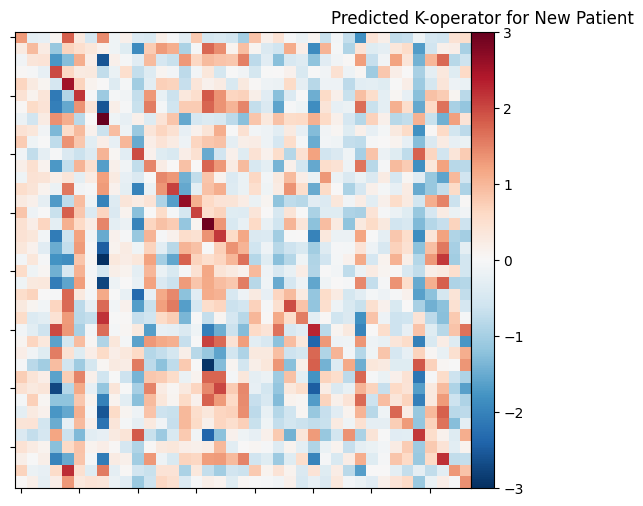

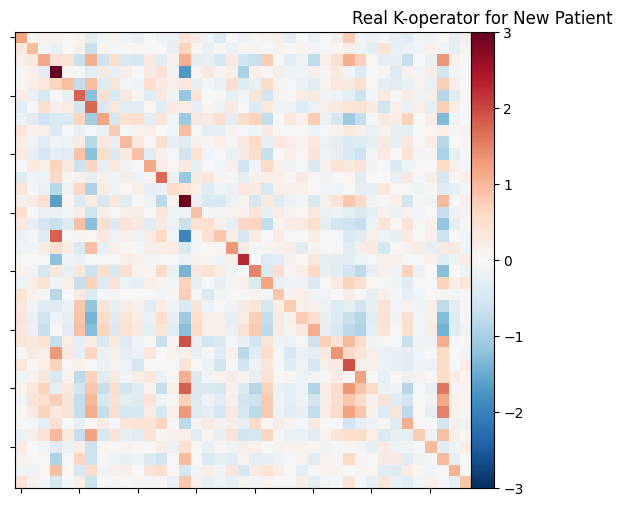

K predicted, size:  (39, 39)
K measured, size:  (39, 39)
new patient 1521
new patient FU 1521
K predicted, size:  (39, 39)
K measured, size:  (39, 39)
The predicted K-operator is close to the real one, within tolerance 5


In [54]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from nilearn import plotting
from numpy.linalg import inv

# Flatten the training data for regression
X_train = np.vstack((female_BL.flatten(), male_BL.flatten()))  # Independent variables
y_train = np.array([K_1.flatten(), K_2.flatten()])  # Dependent variables (K matrices)

# Define a simple neural network model to predict estimated_new_patient_FU
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),  # Input layer
    tf.keras.layers.Dense(64, activation='relu'),  # Hidden layer
    tf.keras.layers.Dense(y_train.shape[1])  # Output layer with the same dimension as y_train
])

# Compile the model with an optimizer and loss function
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(X_train, y_train, epochs=50)  # Adjust epochs for better results

# Now, predict the estimated_new_patient_FU given "new_patient" as input
new_patient_flat = new_patient.flatten().reshape(1, -1)  # Prepare for input
estimated_new_patient_FU = model.predict(new_patient_flat).reshape(39, 39)
print("estimated new patient, size of the matrix: ", estimated_new_patient_FU.shape)


# Compute K_predicted as the dot product of estimated_new_patient_FU with the inverse of new_patient
K_predicted = estimated_new_patient_FU * np.linalg.inv(new_patient)

# Visualization
plotting.plot_matrix(K_predicted, colorbar=True, vmax=3, vmin=-3)
plt.title("Predicted K-operator for New Patient")
plt.savefig("K_predicted_tensor_flow.jpeg")  # Save as JPEG
plt.show()

# To get back to the original shapes
new_patient = new_patient.reshape(39, 39)
measured_new_patient_FU = measured_new_patient_FU.reshape(39, 39)

plotting.plot_matrix(K_measured, colorbar=True, vmax=3, vmin=-3)
plt.title("Real K-operator for New Patient")
plt.savefig("K_measured_tensor_flow.jpeg")  # Save as JPEG
plt.show()

# to get back to the original shape
K_predicted = K_predicted.reshape(39, 39)

print("K predicted, size: ", K_predicted.shape)
print("K measured, size: ", K_measured.shape)
print("new patient", new_patient.size)
print("new patient FU", measured_new_patient_FU.size)

K_measured = measured_new_patient_FU * np.linalg.inv(new_patient)

print("K predicted, size: ", K_predicted.shape)
print("K measured, size: ", K_measured.shape)

# Check the closeness between predicted and measured K
tolerance = 5
is_close = np.allclose(K_predicted, K_measured, atol=tolerance)

if is_close:
    print("The predicted K-operator is close to the real one, within tolerance", tolerance)
else:
    print("The predicted K-operator is not close to the real one, within tolerance", tolerance)

